# Create a model on the protein data

## Data source

Data are located under the directory `raw` and taken from the following paper:
<ul>
<b>Deciphering the determinants of recombinant protein yield across the human secretome</b>
Helen O. Masson, Chih-Chung Kuo, Magdalena Malm, Magnus Lundqvist, Åsa Sievertsson, Anna Berling, Hanna Tegel, Sophia Hober,  Mathias Uhlén, Luigi Grassi, Diane Hatton, Johan Rockberg, Nathan E. Lewis

doi: https://doi.org/10.1101/2022.12.12.520152
</ul>

Data are from the paper's [supplemental section](https://www.biorxiv.org/content/10.1101/2022.12.12.520152v1.supplementary-material)

More specifically, two files are analyzed from `raw` which are sourced from:
 - `raw/media-4.xlsx` -> [Supplementary Data 2](https://www.biorxiv.org/content/biorxiv/early/2022/12/14/2022.12.12.520152/DC4/embed/media-4.xlsx?download=true)
 - `raw/media-12.xlsx` -> [Supplementary Data 10](https://www.biorxiv.org/content/biorxiv/early/2022/12/14/2022.12.12.520152/DC12/embed/media-12.xlsx?download=true)

## Notes

If you have problems with `openpyxl` when loading the xlsx file, try changing to kernel `Python(jupter)`, or else create a conda environment with all the pip install'd packages below and try running the notebook server from the new environment.

### Import Libraries and Define Functions

In [56]:
import pandas as pd
import numpy as np
import missingno as msno
import shap

from sklearn.model_selection import train_test_split
from sklearn.impute import KNNImputer
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split

# ML
import optuna
from optuna.integration import CatBoostPruningCallback
from sklearn.svm import SVC
from lightgbm import LGBMClassifier
import catboost as cb
import xgboost as xgb
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier

# Plot
import seaborn as sns
import matplotlib.pyplot as plt

from interpret import show
from interpret.provider import InlineProvider
from interpret import set_visualize_provider
from interpret.glassbox import ExplainableBoostingClassifier

ModuleNotFoundError: No module named 'interpret'

In [2]:
# Functions

def show_heatmap(df, predictor_list, target = 'Status', figsize = (20,10), title='Correlation Heatmap'):
    # create a correlation matrix but specify numeric_only=True to only include columns with numeric data
    correlation_matrix = df[predictor_list + [target]].corr(method='pearson', min_periods=1)
    # create a mask for the upper triangle
    mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))
    # set up the matplotlib figure
    plt.figure(figsize=figsize)
    # add a title
    plt.title(title)
    # plot the heatmap
    sns.heatmap(correlation_matrix, mask=mask, annot=True, fmt=".2f", cmap='coolwarm', center=0, linewidths=0.5)
    plt.show()

def standardize_values(X):
    from sklearn.preprocessing import StandardScaler
    # create a standard scaler object
    scaler = StandardScaler()
    # fit the scaler to the data
    scaler.fit(X)
    # transform the data
    X_stand = scaler.transform(X)
    return X_stand

def t_sne_plot(X, y, title='t-SNE plot'):
    import matplotlib.pyplot as plt
    from sklearn.manifold import TSNE
    # create a t-SNE object
    tsne = TSNE(n_components=2, random_state=0)
    # fit the t-SNE object to the data
    X_tsne = tsne.fit_transform(X)
    # create a scatter plot of the t-SNE data
    plt.figure(figsize=(10,10))
    plt.scatter(X_tsne[y==0, 0], X_tsne[y==0, 1], label='Fail', c='red', alpha=0.5)
    plt.scatter(X_tsne[y==1, 0], X_tsne[y==1, 1], label='Pass', c='blue', alpha=0.5)
    plt.title(title)
    plt.legend()
    plt.show()

def new_evaluate(model, X, y):
    proba_preds = model.predict_proba(X)[:,1]
    preds = model.predict(X)
    pred_labels = np.rint(preds)

    import sklearn.metrics as metrics
    # calculate the fpr and tpr for all thresholds of the classification
    fpr, tpr, threshold = metrics.roc_curve(y, proba_preds)
    # calculate AUC
    roc_auc = metrics.auc(fpr, tpr)
    # calculate accuracy
    accuracy = metrics.accuracy_score(y, pred_labels)

    print(f"AUC={roc_auc:.3f}")
    print(f"Accuracy={accuracy:.3f}")
          
    #plot a confusion matrix
    cm = metrics.confusion_matrix(y, pred_labels)

    # plot a confusion matrix as a heatmap
    import matplotlib.pyplot as plt
    import seaborn as sns
    # label axes as "predicted and "actual"
    ax = sns.heatmap(cm, annot=True, fmt="d", cmap='Blues')#, center=0, linewidths=0.5)
    ax.set(xlabel='Predicted', ylabel='Actual')
    plt.show()

    # print the classification report
    print(metrics.classification_report(y, pred_labels))

    # plot the ROC curve
    # label axes
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    #add grid
    plt.grid(True)
    # plot the ROC curve
    plt.plot(fpr, tpr, label=f"AUC={roc_auc:.3f}")
    # plot the 45 degree line
    plt.plot([0,1], [0,1], 'k--', label="Random")
    # add a legend
    plt.legend()
    # show the plot
    #plt.show()


### Load data

In [3]:
# read in the sheet called 'all features' from the raw/media-4.xlsx excel file

df = pd.read_excel('data/media-4.xlsx', sheet_name='all features')
target_df = pd.read_excel('data/media-12.xlsx')

# drop unnecessary columns
df = df.drop(columns=['sample_ID','uniprot_id'])
target_df = target_df[['Gene.name', 'Status']]

# Rename column in the target for merging
target_df = target_df.rename(columns={'Gene.name':'human_symbol'})

# Set Index
df.set_index('human_symbol', inplace=True)
target_df.set_index('human_symbol', inplace=True)

# Group by index and calculate the mean for each group (this will erase duplicate genes)
df = df.groupby(df.index).mean()

### Pre-processing

<Axes: >

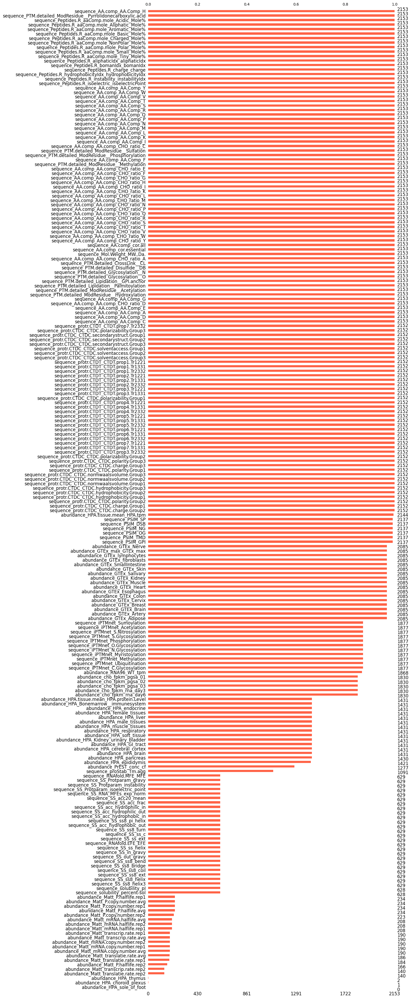

In [4]:
# Missing values
msno.bar(df,figsize=(12, 48), sort="ascending",fontsize=12, color='tomato')

In [5]:
# Drop columns with more than 50% of missing values

# Define the threshold
threshold = 0.5

# Calculate the percentage of missing values for each column
missing_percentage = df.isnull().mean()

# Drop columns exceeding the threshold
columns_to_drop = missing_percentage[missing_percentage > threshold].index
df_dropped = df.drop(columns=columns_to_drop)

In [6]:
# Use KNN inputer to inpute the rest of the missing values

# Save the original index
original_index = df_dropped.index

imputer = KNNImputer(n_neighbors=5)
df_imputed_array = imputer.fit_transform(df_dropped)

df_imputed = pd.DataFrame(df_imputed_array, columns=df_dropped.columns, index=original_index)

In [7]:
# Replace 'Pass' with 1 and anything else with 0 in the target_df

target_df.loc[:,'Status'] = target_df['Status'].replace({'Pass':1})
# if 'Status' != 1, replace with 0
target_df.loc[(target_df['Status']!=1),'Status'] = 0
# display unique classes in 'Status' column
display(target_df['Status'].groupby(target_df['Status']).count())
target_df.head()

Status
0     895
1    1270
Name: Status, dtype: int64

,Status
human_symbol,
A1BG,1
A2M,1
A2ML1,0
AADACL2,0
ABHD15,0


In [8]:
# subsample tartet_df['Status'] == 1 to 895
pass_df = target_df[target_df['Status'] == 1].sample(n=895, random_state=1)
fail_df = target_df[target_df['Status'] == 0]

# combine pass_df and fail_df
new_target_df = pd.concat([pass_df, fail_df])

print(new_target_df['Status'].groupby(new_target_df['Status']).count())
new_target_df.head()

Status
0    895
1    895
Name: Status, dtype: int64


,Status
human_symbol,
PRL,1
CD55,1
IFNA7,1
DEFB116,1
RBP3,1


In [9]:
# Combine features df with Targets df

df_merged = df_imputed.join(new_target_df, how='inner')
print(df_merged.shape)

(1760, 171)


### Explore balance and variability 

In [10]:
# find any columns with zero variability
zero_var_cols = df_merged.columns[df_merged.nunique() == 1]
print(zero_var_cols)

Index([], dtype='object')


Dropping highly correlated columns can be a useful step in a machine learning pipeline to reduce multicollinearity and simplify the model, especially if you're using algorithms that assume feature independence or can be sensitive to multicollinearity, such as linear regression or logistic regression.

In [11]:
# Define correlation threshold
correlation_threshold = 0.80

# Create correlation matrix (numeric_only=True to only include numeric data)
correlation_matrix = df_merged.corr(method='pearson')

# Select upper triangle of correlation matrix
upper = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))

# Find index of feature columns with correlation greater than correlation_threshold
to_drop = [column for column in upper.columns if any(abs(upper[column]) > correlation_threshold)]

# Print columns to drop and their highly correlated counterparts
for column in to_drop:
    print(f"Column {column} is highly correlated with {list(upper.index[upper[column] > correlation_threshold])}")

print()
print(f'{len(to_drop)} columns to drop: {to_drop}')

Column abundance_GTEx_Breast is highly correlated with ['abundance_GTEx_Adipose']
Column abundance_GTEx_max_GTEx_max is highly correlated with ['abundance_GTEx_Salivary']
Column abundance_HPA.tissue.mean_HPA.protein.Level is highly correlated with ['abundance_HPA_Kidney_urinary_bladder', 'abundance_HPA_endocrine', 'abundance_HPA_liver', 'abundance_HPA_respiratory']
Column abundance_cho_fpkm_pgsa_01 is highly correlated with ['abundance_RNA96_WT_tpm']
Column abundance_cho_fpkm_pgsa_02 is highly correlated with ['abundance_RNA96_WT_tpm', 'abundance_cho_fpkm_pgsa_01']
Column abundance_cho_fpkm_pgsa_03 is highly correlated with ['abundance_RNA96_WT_tpm', 'abundance_cho_fpkm_pgsa_01', 'abundance_cho_fpkm_pgsa_02']
Column sequence_AA.comp_AA.comp_CHO_ratio_A is highly correlated with ['sequence_AA.comp_AA.Comp_A']
Column sequence_AA.comp_AA.comp_CHO_ratio_C is highly correlated with ['sequence_AA.comp_AA.Comp_C']
Column sequence_AA.comp_AA.comp_CHO_ratio_D is highly correlated with ['sequenc

Next we create a list of predictor columns (features) that will be used in a machine learning model, while excluding certain columns that are not useful as predictors or have been identified to be removed due to high correlation.

In [12]:
predictor_list = list(df_merged.columns)
predictor_list.remove('Status')

#remove the columns to drop
predictor_list = [x for x in predictor_list if x not in to_drop]
print(len(predictor_list))

117


Nothing Appears to be strongly correlated with the target (Status) **See the bottom of the plot**

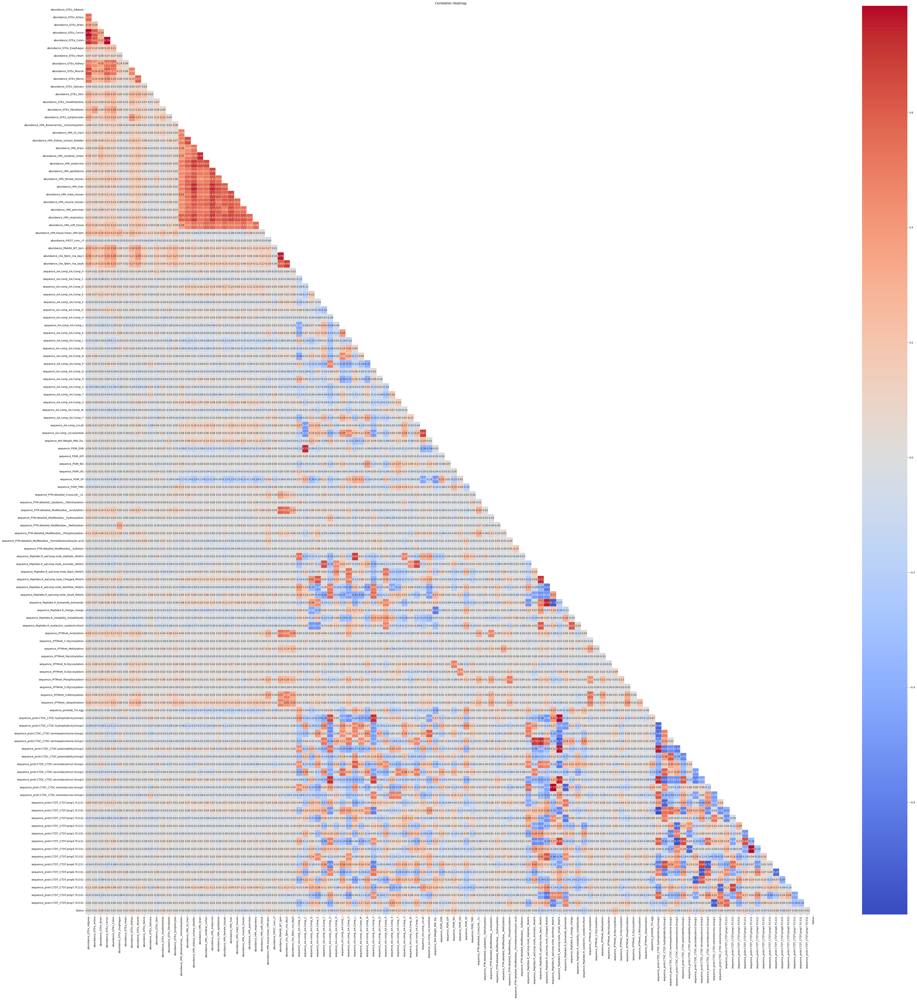

In [13]:
show_heatmap(df=df_merged, target='Status', predictor_list=predictor_list, title='Correlation Heatmap', figsize=(65,65))

### Explore effect of standardization

Seems to have no effect on correlation, good

In [14]:
X_stand  = standardize_values(df_merged[predictor_list].values)

# convert X_stand to a dataframe with columns = df.columns
X_stand_df = pd.DataFrame(X_stand, columns=predictor_list)
# set index of X_stand_df to be the same as new_df
X_stand_df.index = df_merged.index
# add 'Status' to X_stand_df
X_stand_df['Status'] = df_merged['Status']
X_stand_df.describe()

,abundance_GTEx_Adipose,abundance_GTEx_Artery,abundance_GTEx_Brain,abundance_GTEx_Cervix,abundance_GTEx_Colon,abundance_GTEx_Esophagus,abundance_GTEx_Heart,abundance_GTEx_Kidney,abundance_GTEx_Muscle,abundance_GTEx_Nerve,...,sequence_protr.CTDT_CTDT.prop2.Tr1331,sequence_protr.CTDT_CTDT.prop4.Tr1221,sequence_protr.CTDT_CTDT.prop4.Tr1331,sequence_protr.CTDT_CTDT.prop5.Tr1331,sequence_protr.CTDT_CTDT.prop6.Tr1221,sequence_protr.CTDT_CTDT.prop6.Tr1331,sequence_protr.CTDT_CTDT.prop6.Tr2332,sequence_protr.CTDT_CTDT.prop7.Tr1221,sequence_protr.CTDT_CTDT.prop7.Tr1331,sequence_protr.CTDT_CTDT.prop7.Tr2332
count,1.760000e+03,1.760000e+03,1.760000e+03,1.760000e+03,1.760000e+03,1.760000e+03,1.760000e+03,1.760000e+03,1.760000e+03,1.760000e+03,...,1.760000e+03,1.760000e+03,1.760000e+03,1.760000e+03,1.760000e+03,1.760000e+03,1.760000e+03,1.760000e+03,1.760000e+03,1.760000e+03
mean,3.229740e-17,-3.330669e-17,-4.239033e-17,2.018587e-17,3.835316e-17,2.018587e-18,-2.018587e-18,2.422305e-17,-6.812732e-18,-1.614870e-17,...,-7.468773e-16,4.743680e-16,-6.661338e-17,-3.159089e-16,7.004498e-16,-6.055762e-17,3.471970e-16,-4.107825e-16,-1.826822e-16,-3.027881e-16
std,1.000284e+00,1.000284e+00,1.000284e+00,1.000284e+00,1.000284e+00,1.000284e+00,1.000284e+00,1.000284e+00,1.000284e+00,1.000284e+00,...,1.000284e+00,1.000284e+00,1.000284e+00,1.000284e+00,1.000284e+00,1.000284e+00,1.000284e+00,1.000284e+00,1.000284e+00,1.000284e+00
min,-2.903032e-01,-1.963241e-01,-2.219522e-01,-2.789762e-01,-3.081502e-01,-1.085398e-01,-5.531784e-02,-2.693486e-01,-2.411352e-01,-1.344659e-01,...,-4.487691e+00,-4.732727e+00,-3.726355e+00,-1.845995e+00,-4.886270e+00,-3.771528e+00,-4.133979e+00,-4.850014e+00,-4.527477e+00,-3.493309e+00
25%,-2.894373e-01,-1.960139e-01,-2.200493e-01,-2.779196e-01,-3.059688e-01,-1.080799e-01,-5.522505e-02,-2.675388e-01,-2.405787e-01,-1.340873e-01,...,-6.459321e-01,-5.721827e-01,-6.273027e-01,-6.219414e-01,-4.579401e-01,-5.914177e-01,-5.636875e-01,-5.551833e-01,-5.820015e-01,-6.201760e-01
50%,-2.760525e-01,-1.908384e-01,-2.012410e-01,-2.635325e-01,-2.806883e-01,-1.028644e-01,-5.375671e-02,-2.504279e-01,-2.302081e-01,-1.282597e-01,...,-5.607877e-02,-2.797841e-02,-2.287428e-02,-1.258852e-01,6.686760e-02,-9.504155e-02,3.523781e-02,7.438022e-02,-8.492011e-03,-1.658445e-02
75%,-1.626351e-01,-1.351131e-01,-1.083273e-01,-1.433709e-01,-1.182501e-01,-6.221529e-02,-4.079843e-02,-1.272610e-01,-1.294220e-01,-7.454124e-02,...,6.485457e-01,5.541462e-01,5.810953e-01,4.817162e-01,5.557718e-01,4.988551e-01,6.492961e-01,6.169779e-01,5.372122e-01,6.151731e-01
max,1.418888e+01,2.629877e+01,1.843522e+01,1.615121e+01,1.644791e+01,3.788031e+01,4.155078e+01,1.768701e+01,1.943456e+01,3.565804e+01,...,3.642690e+00,4.494137e+00,4.614527e+00,7.248840e+00,4.831343e+00,6.870092e+00,4.737960e+00,4.132615e+00,6.452190e+00,1.070147e+01


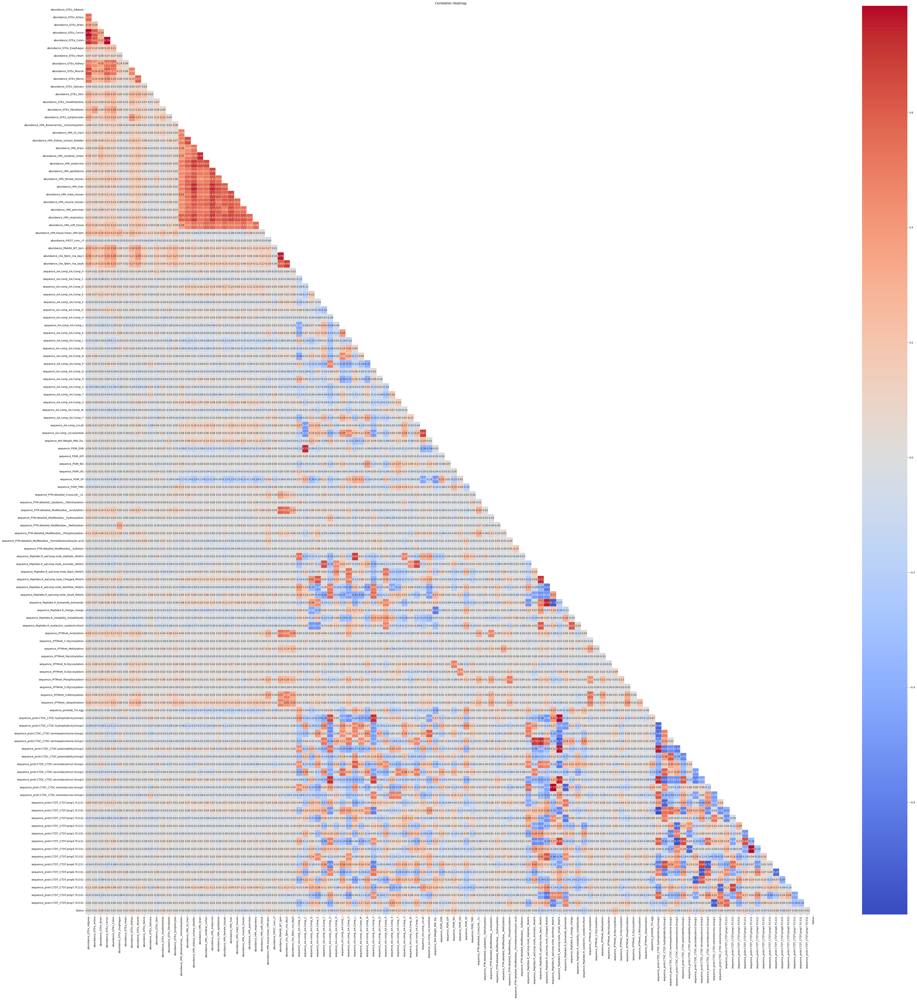

In [15]:
show_heatmap(df=X_stand_df, target='Status', predictor_list=predictor_list, title='Correlation Heatmap', figsize=(65,65))

### Look at t-SNE, is there any structure at all?
If not, maybe this won't work.

Hmm. This really looks like noise, but lets see

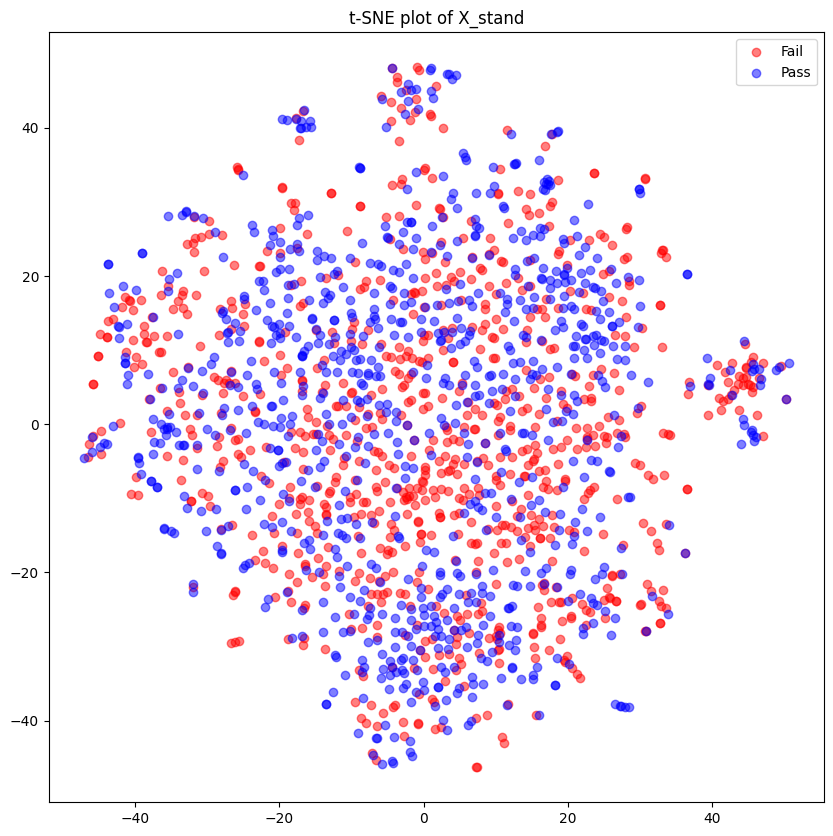

In [16]:
# create a t-sne plot of the data in new_df colored by the 'Status' column
t_sne_plot(X_stand, df_merged['Status'], title='t-SNE plot of X_stand')

### Data splitting strategy

In [17]:
df_merged['Status'].astype(int)
df_merged.shape

(1760, 171)

In [18]:
# Shuffle the rows and split the data into training, validation, calibration, and testing sets

# Step 1: Split the data into training (70%) and temporary (30%) sets
train_df, tmp_df = train_test_split(df_merged, test_size=0.3, random_state=1, stratify=df_merged['Status'])
# train_df: 70% of the data, used for training the model
# tmp_df: 30% of the data, used for further splitting into validation and testing sets

# Step 2: Split the temporary set into validation (20% of the original) and testing (10% of the original) sets
tmp2_df, test_df = train_test_split(tmp_df, test_size=0.33, random_state=1, stratify=tmp_df['Status'])
# tmp2_df: ~20% of the original data, used for further splitting into validation and calibration sets
# test_df: ~10% of the original data, used for final model testing

# Step 3: Split the tmp2_df data into validation (10% of the original) and calibration (10% of the original) sets
val_df, cal_df = train_test_split(tmp2_df, test_size=0.5, random_state=1, stratify=tmp2_df['Status'])
# val_df: ~10% of the original data, used for model validation during training
# cal_df: ~10% of the original data, used for model calibration or hyperparameter tuning

# Display the shapes of the resulting datasets
train_df.shape, val_df.shape, cal_df.shape, test_df.shape

((1232, 171), (176, 171), (177, 171), (175, 171))

In [19]:
# check the distribution of 'Status' in train_df, val_df, cal_df, and test_df
display(train_df['Status'].groupby(train_df['Status']).count())
display(val_df['Status'].groupby(val_df['Status']).count())
display(cal_df['Status'].groupby(cal_df['Status']).count())
display(test_df['Status'].groupby(test_df['Status']).count())


Status
0    613
1    619
Name: Status, dtype: int64

Status
0    88
1    88
Name: Status, dtype: int64

Status
0    88
1    89
Name: Status, dtype: int64

Status
0    87
1    88
Name: Status, dtype: int64

## Train models

In [28]:


def get_data():
    y = train_df['Status'].values.astype(int)  # Ensure the target values are integers
    X = train_df[predictor_list].values
    return X, y

# Objective function for Optuna
def objective(trial: optuna.Trial) -> float:
    X, y = get_data()
    train_x, valid_x, train_y, valid_y = train_test_split(X, y, test_size=0.25, stratify=y)
    
    # Suggest classifier
    classifier_name = trial.suggest_categorical("classifier", ["CatBoost", "XGBoost", "LightGBM", "RandomForest", "LogisticRegression"])
    
    if classifier_name == "CatBoost":
        param = {
            "objective": trial.suggest_categorical("objective", ["Logloss", "CrossEntropy"]),
            "colsample_bylevel": trial.suggest_float("cat_colsample_bylevel", 0.01, 0.1, log=True),
            "depth": trial.suggest_int("cat_depth", 1, 12),
            "boosting_type": trial.suggest_categorical("cat_boosting_type", ["Ordered", "Plain"]),
            "bootstrap_type": trial.suggest_categorical("cat_bootstrap_type", ["Bayesian", "Bernoulli", "MVS"]),
            "used_ram_limit": "3gb",
            "eval_metric": "AUC",
        }
        if param["bootstrap_type"] == "Bayesian":
            param["bagging_temperature"] = trial.suggest_float("cat_bagging_temperature", 0, 10)
        elif param["bootstrap_type"] == "Bernoulli":
            param["subsample"] = trial.suggest_float("cat_subsample", 0.1, 1, log=True)

        gbm = cb.CatBoostClassifier(**param)
        pruning_callback = CatBoostPruningCallback(trial, "AUC")
        gbm.fit(
            train_x,
            train_y,
            eval_set=[(valid_x, valid_y)],
            verbose=0,
            early_stopping_rounds=100,
            callbacks=[pruning_callback],
        )
        pruning_callback.check_pruned()
        preds = gbm.predict(valid_x)
        
    elif classifier_name == "XGBoost":
        param = {
            "objective": "binary:logistic",
            "colsample_bytree": trial.suggest_float("xgb_colsample_bytree", 0.5, 1.0),
            "learning_rate": trial.suggest_float("xgb_learning_rate", 0.01, 0.1),
            "max_depth": trial.suggest_int("xgb_max_depth", 1, 12),
            "n_estimators": trial.suggest_int("xgb_n_estimators", 100, 1000),
            "subsample": trial.suggest_float("xgb_subsample", 0.5, 1.0),
            "early_stopping_rounds": 100,
        }
        gbm = xgb.XGBClassifier(**param)
        gbm.fit(train_x, train_y, eval_set=[(valid_x, valid_y)], verbose=False)
        preds = gbm.predict(valid_x)

    elif classifier_name == "LightGBM":
        param = {
            "objective": "binary",
            "metric": "binary_logloss",
            "colsample_bytree": trial.suggest_float("lgb_colsample_bytree", 0.5, 1.0),
            "learning_rate": trial.suggest_float("lgb_learning_rate", 0.01, 0.1),
            "max_depth": trial.suggest_int("lgb_max_depth", 1, 12),
            "n_estimators": trial.suggest_int("lgb_n_estimators", 100, 1000),
            "subsample": trial.suggest_float("lgb_subsample", 0.5, 1.0),
            "early_stopping_rounds": 100,
        }
        gbm = LGBMClassifier(**param)
        gbm.fit(train_x, train_y, eval_set=[(valid_x, valid_y)])
        preds = gbm.predict(valid_x)
        
    elif classifier_name == "RandomForest":
        param = {
            "n_estimators": trial.suggest_int("rf_n_estimators", 100, 1000),
            "max_depth": trial.suggest_int("rf_max_depth", 1, 12),
            "min_samples_split": trial.suggest_int("rf_min_samples_split", 2, 10),
            "min_samples_leaf": trial.suggest_int("rf_min_samples_leaf", 1, 10),
            "bootstrap": trial.suggest_categorical("rf_bootstrap", [True, False]),
        }
        gbm = RandomForestClassifier(**param)
        gbm.fit(train_x, train_y)
        preds = gbm.predict(valid_x)
        
    elif classifier_name == "LogisticRegression":
        param = {
            "C": trial.suggest_float("lr_C", 1e-6, 1e2, log=True),
            "max_iter": trial.suggest_int("lr_max_iter", 100, 1000),
            "solver": trial.suggest_categorical("lr_solver", ["lbfgs", "liblinear", "sag", "saga"]),
        }
        gbm = LogisticRegression(**param)
        gbm.fit(train_x, train_y)
        preds = gbm.predict(valid_x)


    pred_labels = np.rint(preds).astype(int) # Ensure binary format (0 or 1)
    valid_y = valid_y.astype(int)
    accuracy = accuracy_score(valid_y, pred_labels)
    return accuracy

In [31]:
# Optuna Study

import warnings
warnings.filterwarnings("ignore")

study = optuna.create_study(
    pruner=optuna.pruners.MedianPruner(n_warmup_steps=5), direction="maximize"
)
study.optimize(objective, n_trials=500, timeout=3600)

print("Number of finished trials: {}".format(len(study.trials)))

print("Best trial:")
trial = study.best_trial

print("  Value: {}".format(trial.value))

print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

# Save the study
optuna.study.write(study, storage='sqlite:///optimization_study.db')

[I 2024-07-30 14:45:18,250] A new study created in memory with name: no-name-8cd4a9ef-ba8d-4459-805c-a582ac016c0f


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002781 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21677
[LightGBM] [Info] Number of data points in the train set: 924, number of used features: 107
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.502165 -> initscore=0.008658
[LightGBM] [Info] Start training from score 0.008658
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[I 2024-07-30 14:45:19,208] Trial 0 finished with value: 0.672077922077922 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.9035610265029514, 'lgb_learning_rate': 0.02211039464421998, 'lgb_max_depth': 6, 'lgb_n_estimators': 315, 'lgb_subsample': 0.5899781993165514}. Best is trial 0 with value: 0.672077922077922.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-30 14:45:21,037] Trial 1 finished with value: 0.6948051948051948 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 302, 'rf_max_depth': 12, 'rf_min_samples_split': 6, 'rf_min_samples_leaf': 10, 'rf_bootstrap': False}. Best is trial 1 with value: 0.6948051948051948.
[I 2024-07-30 14:45:21,661] Trial 2 finished with value: 0.6753246753246753 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.985437508843467, 'xgb_learning_rate': 0.08653734146379553, 'xgb_max_depth': 7, 'xgb_n_estimators': 269, 'xgb_subsample': 0.8241623416477125}. Best is trial 1 with value: 0.6948051948051948.
[I 2024-07-30 14:45:22,728] Trial 3 finished with value: 0.711038961038961 and parameters: {'classifier': 'CatBoost', 'objective': 'Logloss', 'cat_colsample_bylevel': 0.028031444392673976, 'cat_depth': 4, 'cat_boosting_type': 'Ordered', 'cat_bootstrap_type': 'Bayesian', 'cat_bagging_temperature': 2.1257043641560913}. Best is trial 3 with value: 0.711038961038961.
[I 2024

[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001538 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21647
[LightGBM] [Info] Number of data points in the train set: 924, number of used features: 107
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.502165 -> initscore=0.008658
[LightGBM] [Info] Start training from score 0.008658
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[I 2024-07-30 14:45:29,050] Trial 12 finished with value: 0.6655844155844156 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.50865986522327, 'lgb_learning_rate': 0.09466708364106508, 'lgb_max_depth': 12, 'lgb_n_estimators': 943, 'lgb_subsample': 0.9522546089958258}. Best is trial 3 with value: 0.711038961038961.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[25]	valid_0's binary_logloss: 0.612355


[I 2024-07-30 14:45:29,885] Trial 13 finished with value: 0.5064935064935064 and parameters: {'classifier': 'LogisticRegression', 'lr_C': 1.0875938457492167e-06, 'lr_max_iter': 926, 'lr_solver': 'sag'}. Best is trial 3 with value: 0.711038961038961.
[I 2024-07-30 14:45:33,567] Trial 14 finished with value: 0.711038961038961 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 958, 'rf_max_depth': 12, 'rf_min_samples_split': 2, 'rf_min_samples_leaf': 10, 'rf_bootstrap': True}. Best is trial 3 with value: 0.711038961038961.
[I 2024-07-30 14:45:33,644] Trial 15 pruned. Trial was pruned at iteration 5.
[I 2024-07-30 14:45:37,346] Trial 16 finished with value: 0.6558441558441559 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 984, 'rf_max_depth': 8, 'rf_min_samples_split': 2, 'rf_min_samples_leaf': 6, 'rf_bootstrap': True}. Best is trial 3 with value: 0.711038961038961.
[I 2024-07-30 14:45:37,532] Trial 17 pruned. Trial was pruned at iteration 5.
[I 2024-07-30

[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460


[I 2024-07-30 14:45:38,035] Trial 19 finished with value: 0.6493506493506493 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.618430035877748, 'lgb_learning_rate': 0.06967934901436953, 'lgb_max_depth': 1, 'lgb_n_estimators': 104, 'lgb_subsample': 0.990755692990219}. Best is trial 3 with value: 0.711038961038961.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011970 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21685
[LightGBM] [Info] Number of data points in the train set: 924, number of used features: 107
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.502165 -> initscore=0.008658
[LightGBM] [Info] Start training from score 0.008658
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Ligh

[I 2024-07-30 14:45:39,718] Trial 20 finished with value: 0.6136363636363636 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.7364941762416046, 'xgb_learning_rate': 0.03404020210173471, 'xgb_max_depth': 12, 'xgb_n_estimators': 779, 'xgb_subsample': 0.9777067795120028}. Best is trial 3 with value: 0.711038961038961.
[I 2024-07-30 14:45:42,986] Trial 21 finished with value: 0.6103896103896104 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 840, 'rf_max_depth': 12, 'rf_min_samples_split': 5, 'rf_min_samples_leaf': 10, 'rf_bootstrap': True}. Best is trial 3 with value: 0.711038961038961.
[I 2024-07-30 14:45:45,401] Trial 22 finished with value: 0.7045454545454546 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 661, 'rf_max_depth': 9, 'rf_min_samples_split': 2, 'rf_min_samples_leaf': 10, 'rf_bootstrap': True}. Best is trial 3 with value: 0.711038961038961.
[I 2024-07-30 14:45:47,956] Trial 23 finished with value: 0.6915584415584416 and 

[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002572 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21681
[LightGBM] [Info] Number of data points in the train set: 924, number of used features: 108
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.502165 -> initscore=0.008658
[LightGBM] [Info] Start training from score 0.008658
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[I 2024-07-30 14:46:04,713] Trial 29 finished with value: 0.7077922077922078 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.9823430638978503, 'lgb_learning_rate': 0.011697731891057862, 'lgb_max_depth': 12, 'lgb_n_estimators': 868, 'lgb_subsample': 0.5112136176585429}. Best is trial 3 with value: 0.711038961038961.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[344]	valid_0's binary_logloss: 0.563065
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002316 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21656
[LightGBM] [Info] Number of data points in the train set: 924, number of used features: 107
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.502165 -> initscore=0.008658
[LightGBM] [Info] Start training from score 0.008658
Training unt

[I 2024-07-30 14:46:06,292] Trial 30 finished with value: 0.6623376623376623 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.9802683363962409, 'lgb_learning_rate': 0.02011210580171601, 'lgb_max_depth': 11, 'lgb_n_estimators': 856, 'lgb_subsample': 0.5051131698324798}. Best is trial 3 with value: 0.711038961038961.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[94]	valid_0's binary_logloss: 0.621057
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.195867 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 21656
[LightGBM] [Info] Number of data points in the train set: 924, number of used features: 107
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[Light

[I 2024-07-30 14:46:08,542] Trial 31 finished with value: 0.685064935064935 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.7959820029522463, 'lgb_learning_rate': 0.01037105204531101, 'lgb_max_depth': 8, 'lgb_n_estimators': 637, 'lgb_subsample': 0.7116527740356743}. Best is trial 3 with value: 0.711038961038961.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-30 14:46:09,325] Trial 32 finished with value: 0.6655844155844156 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.7841764581451601, 'lgb_learning_rate': 0.044786376161124956, 'lgb_max_depth': 7, 'lgb_n_estimators': 658, 'lgb_subsample': 0.7589415936460017}. Best is trial 3 with value: 0.711038961038961.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-30 14:46:09,552] Trial 33 finished with value: 0.6233766233766234 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.9739190403344451, 'lgb_learning_rate': 0.046489507091924454, 'lgb_max_depth': 2, 'lgb_n_estimators': 1000, 'lgb_subsample': 0.6948874576961046}. Best is trial 3 with value: 0.711038961038961.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-30 14:46:09,800] Trial 34 finished with value: 0.672077922077922 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.9862273226109461, 'xgb_learning_rate': 0.09296629026284951, 'xgb_max_depth': 1, 'xgb_n_estimators': 158, 'xgb_subsample': 0.5188130572200171}. Best is trial 3 with value: 0.711038961038961.
[I 2024-07-30 14:46:11,919] Trial 35 finished with value: 0.6818181818181818 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 511, 'rf_max_depth': 10, 'rf_min_samples_split': 7, 'rf_min_samples_leaf': 8, 'rf_bootstrap': True}. Best is trial 3 with value: 0.711038961038961.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003185 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21627
[LightGBM] [Info] Number of data points in the train set: 924, number of used features: 106
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.502165 -> initscore=0.008658
[LightGBM] [Info] Start training from score 0.008658
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[I 2024-07-30 14:46:13,867] Trial 36 finished with value: 0.6461038961038961 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.8605645094724343, 'lgb_learning_rate': 0.07370715889940191, 'lgb_max_depth': 10, 'lgb_n_estimators': 757, 'lgb_subsample': 0.8424005590132855}. Best is trial 3 with value: 0.711038961038961.
[I 2024-07-30 14:46:16,864] Trial 37 finished with value: 0.6688311688311688 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 840, 'rf_max_depth': 7, 'rf_min_samples_split': 4, 'rf_min_samples_leaf': 10, 'rf_bootstrap': True}. Best is trial 3 with value: 0.711038961038961.
[I 2024-07-30 14:46:17,518] Trial 38 finished with value: 0.5 and parameters: {'classifier': 'LogisticRegression', 'lr_C': 1.0678040721623907e-06, 'lr_max_iter': 789, 'lr_solver': 'saga'}. Best is trial 3 with value: 0.711038961038961.
[I 2024-07-30 14:46:19,742] Trial 39 finished with value: 0.6688311688311688 and parameters: {'classifier': 'RandomForest', 'rf_n_estima

[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001173 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21648
[LightGBM] [Info] Number of data points in the train set: 924, number of used features: 107
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.502165 -> initscore=0.008658
[LightGBM] [Info] Start training from score 0.008658
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[I 2024-07-30 14:46:25,688] Trial 50 finished with value: 0.7045454545454546 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.6843875125763428, 'lgb_learning_rate': 0.035747291073777845, 'lgb_max_depth': 4, 'lgb_n_estimators': 450, 'lgb_subsample': 0.5034702000333408}. Best is trial 3 with value: 0.711038961038961.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-30 14:46:26,653] Trial 51 finished with value: 0.685064935064935 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 729, 'rf_max_depth': 1, 'rf_min_samples_split': 2, 'rf_min_samples_leaf': 4, 'rf_bootstrap': True}. Best is trial 3 with value: 0.711038961038961.
[I 2024-07-30 14:46:28,938] Trial 52 finished with value: 0.6688311688311688 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 751, 'rf_max_depth': 5, 'rf_min_samples_split': 3, 'rf_min_samples_leaf': 4, 'rf_bootstrap': True}. Best is trial 3 with value: 0.711038961038961.
[I 2024-07-30 14:46:31,987] Trial 53 finished with value: 0.6688311688311688 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 907, 'rf_max_depth': 6, 'rf_min_samples_split': 2, 'rf_min_samples_leaf': 5, 'rf_bootstrap': True}. Best is trial 3 with value: 0.711038961038961.
[I 2024-07-30 14:46:34,715] Trial 54 finished with value: 0.685064935064935 and parameters: {'classifier': 'RandomForest', 'rf_n_es

[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002890 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21641
[LightGBM] [Info] Number of data points in the train set: 924, number of used features: 107
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.502165 -> initscore=0.008658
[LightGBM] [Info] Start training from score 0.008658
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[I 2024-07-30 14:46:43,617] Trial 60 finished with value: 0.6655844155844156 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.8862360997062593, 'lgb_learning_rate': 0.0737305282399183, 'lgb_max_depth': 9, 'lgb_n_estimators': 448, 'lgb_subsample': 0.6012435354298755}. Best is trial 3 with value: 0.711038961038961.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[42]	valid_0's binary_logloss: 0.607164
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001986 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21658
[LightGBM] [Info] Number of data points in the train set: 924, number of used features: 107
[LightGBM] [Warning] early_stopping_round is set=100, ear

[I 2024-07-30 14:46:44,047] Trial 61 finished with value: 0.685064935064935 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.6711250855751686, 'lgb_learning_rate': 0.03363768941471411, 'lgb_max_depth': 5, 'lgb_n_estimators': 444, 'lgb_subsample': 0.5125648556232824}. Best is trial 3 with value: 0.711038961038961.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-30 14:46:44,614] Trial 62 finished with value: 0.685064935064935 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.6818879288698017, 'lgb_learning_rate': 0.031444066024689195, 'lgb_max_depth': 4, 'lgb_n_estimators': 282, 'lgb_subsample': 0.6031873471714192}. Best is trial 3 with value: 0.711038961038961.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[175]	valid_0's binary_logloss: 0.560554
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002056 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2167

[I 2024-07-30 14:46:45,300] Trial 63 finished with value: 0.672077922077922 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.5665300263592401, 'lgb_learning_rate': 0.01458095349646827, 'lgb_max_depth': 3, 'lgb_n_estimators': 532, 'lgb_subsample': 0.5672115472608534}. Best is trial 3 with value: 0.711038961038961.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-30 14:46:45,792] Trial 64 finished with value: 0.6396103896103896 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.7289826783577678, 'lgb_learning_rate': 0.03374926733975018, 'lgb_max_depth': 5, 'lgb_n_estimators': 781, 'lgb_subsample': 0.6679702633463233}. Best is trial 3 with value: 0.711038961038961.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-30 14:46:47,957] Trial 65 finished with value: 0.6883116883116883 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 623, 'rf_max_depth': 6, 'rf_min_samples_split': 5, 'rf_min_samples_leaf': 9, 'rf_bootstrap': True}. Best is trial 3 with value: 0.711038961038961.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001220 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21673
[LightGBM] [Info] Number of data points in the train set: 924, number of used features: 107
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.502165 -> initscore=0.008658
[LightGBM] [Info] Start training from score 0.008658
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[I 2024-07-30 14:46:48,529] Trial 66 finished with value: 0.6688311688311688 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.715125939613874, 'lgb_learning_rate': 0.05793652140953194, 'lgb_max_depth': 7, 'lgb_n_estimators': 275, 'lgb_subsample': 0.8119751418001055}. Best is trial 3 with value: 0.711038961038961.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-30 14:46:48,659] Trial 67 pruned. Trial was pruned at iteration 5.
[I 2024-07-30 14:46:53,042] Trial 68 finished with value: 0.6525974025974026 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 797, 'rf_max_depth': 8, 'rf_min_samples_split': 3, 'rf_min_samples_leaf': 7, 'rf_bootstrap': False}. Best is trial 3 with value: 0.711038961038961.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002043 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21665
[LightGBM] [Info] Number of data points in the train set: 924, number of used features: 107
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.502165 -> initscore=0.008658
[LightGBM] [Info] Start training from score 0.008658
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[I 2024-07-30 14:46:53,994] Trial 69 finished with value: 0.6785714285714286 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.8153876672548821, 'lgb_learning_rate': 0.025516893195454755, 'lgb_max_depth': 12, 'lgb_n_estimators': 620, 'lgb_subsample': 0.534630520010946}. Best is trial 3 with value: 0.711038961038961.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[99]	valid_0's binary_logloss: 0.617207


[I 2024-07-30 14:46:54,124] Trial 70 pruned. Trial was pruned at iteration 5.
[I 2024-07-30 14:46:55,098] Trial 71 finished with value: 0.6785714285714286 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 163, 'rf_max_depth': 12, 'rf_min_samples_split': 7, 'rf_min_samples_leaf': 10, 'rf_bootstrap': False}. Best is trial 3 with value: 0.711038961038961.
[I 2024-07-30 14:46:57,126] Trial 72 finished with value: 0.7077922077922078 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 350, 'rf_max_depth': 12, 'rf_min_samples_split': 6, 'rf_min_samples_leaf': 10, 'rf_bootstrap': False}. Best is trial 3 with value: 0.711038961038961.
[I 2024-07-30 14:46:59,806] Trial 73 finished with value: 0.698051948051948 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 464, 'rf_max_depth': 11, 'rf_min_samples_split': 2, 'rf_min_samples_leaf': 9, 'rf_bootstrap': False}. Best is trial 3 with value: 0.711038961038961.
[I 2024-07-30 14:47:01,240] Trial 74 finished

[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001987 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21643
[LightGBM] [Info] Number of data points in the train set: 924, number of used features: 107
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.502165 -> initscore=0.008658
[LightGBM] [Info] Start training from score 0.008658
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[I 2024-07-30 14:48:07,399] Trial 151 finished with value: 0.724025974025974 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.9338727114326819, 'lgb_learning_rate': 0.09716064924183987, 'lgb_max_depth': 10, 'lgb_n_estimators': 854, 'lgb_subsample': 0.8897614082414373}. Best is trial 103 with value: 0.7467532467532467.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[41]	valid_0's binary_logloss: 0.573237
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001976 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21626
[LightGBM] [Info] Number of data points in the train set: 924, number of used features: 107
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.502165 -> initscore=0.008658
[LightGBM] [Info] Start training from score 0.008658
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No fu

[I 2024-07-30 14:48:08,033] Trial 152 finished with value: 0.6298701298701299 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.9192338952940673, 'lgb_learning_rate': 0.09689605205353564, 'lgb_max_depth': 10, 'lgb_n_estimators': 761, 'lgb_subsample': 0.8953930509818843}. Best is trial 103 with value: 0.7467532467532467.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[10]	valid_0's binary_logloss: 0.643937


[I 2024-07-30 14:48:08,720] Trial 153 finished with value: 0.5194805194805194 and parameters: {'classifier': 'LogisticRegression', 'lr_C': 0.00013476022234306534, 'lr_max_iter': 684, 'lr_solver': 'sag'}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:48:09,361] Trial 154 finished with value: 0.6948051948051948 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.8762316583226263, 'xgb_learning_rate': 0.03513681001794601, 'xgb_max_depth': 3, 'xgb_n_estimators': 229, 'xgb_subsample': 0.9416907968727505}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:48:10,010] Trial 155 finished with value: 0.6753246753246753 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.8497056411662892, 'xgb_learning_rate': 0.08991697959458267, 'xgb_max_depth': 1, 'xgb_n_estimators': 544, 'xgb_subsample': 0.8083890945550148}. Best is trial 103 with value: 0.7467532467532467.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001547 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21660
[LightGBM] [Info] Number of data points in the train set: 924, number of used features: 107
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.502165 -> initscore=0.008658
[LightGBM] [Info] Start training from score 0.008658
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[I 2024-07-30 14:48:10,920] Trial 156 finished with value: 0.6525974025974026 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.8458969626227559, 'lgb_learning_rate': 0.08486878264823335, 'lgb_max_depth': 9, 'lgb_n_estimators': 870, 'lgb_subsample': 0.8976488955063203}. Best is trial 103 with value: 0.7467532467532467.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[17]	valid_0's binary_logloss: 0.630923


[I 2024-07-30 14:48:11,460] Trial 157 finished with value: 0.6266233766233766 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.9098456117624782, 'xgb_learning_rate': 0.0167307640315248, 'xgb_max_depth': 3, 'xgb_n_estimators': 187, 'xgb_subsample': 0.869252856202842}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:48:12,700] Trial 158 finished with value: 0.6915584415584416 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.9709323792420768, 'xgb_learning_rate': 0.051771205170927856, 'xgb_max_depth': 7, 'xgb_n_estimators': 439, 'xgb_subsample': 0.9219139279525284}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:48:12,849] Trial 159 pruned. Trial was pruned at iteration 5.
[I 2024-07-30 14:48:13,550] Trial 160 finished with value: 0.6948051948051948 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.7781756362322222, 'xgb_learning_rate': 0.07465652744739065, 'xgb_max_depth': 5, 'xgb_n_estimators'

[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002207 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21629
[LightGBM] [Info] Number of data points in the train set: 924, number of used features: 107
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.502165 -> initscore=0.008658
[LightGBM] [Info] Start training from score 0.008658
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[I 2024-07-30 14:48:14,395] Trial 161 finished with value: 0.6493506493506493 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.9985625122836084, 'lgb_learning_rate': 0.05997922676715738, 'lgb_max_depth': 11, 'lgb_n_estimators': 887, 'lgb_subsample': 0.7780815210881193}. Best is trial 103 with value: 0.7467532467532467.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[32]	valid_0's binary_logloss: 0.629485
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002047 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21675
[LightGBM] [Info] Number of data points in the train set: 924, number of used features: 107
[LightGBM] [Warning] early_stopping_round is set=100, ear

[I 2024-07-30 14:48:15,317] Trial 162 finished with value: 0.7045454545454546 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.9318113447745309, 'lgb_learning_rate': 0.08656514557090811, 'lgb_max_depth': 12, 'lgb_n_estimators': 703, 'lgb_subsample': 0.86692313709059}. Best is trial 103 with value: 0.7467532467532467.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[33]	valid_0's binary_logloss: 0.586547
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002062 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21647
[LightGBM] [Info] Number of data points in the train set: 924, number of used features: 107
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round

[I 2024-07-30 14:48:16,362] Trial 163 finished with value: 0.7045454545454546 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.945060325638072, 'lgb_learning_rate': 0.04630228228340401, 'lgb_max_depth': 10, 'lgb_n_estimators': 979, 'lgb_subsample': 0.6624013356033267}. Best is trial 103 with value: 0.7467532467532467.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[96]	valid_0's binary_logloss: 0.590184
[LightGBM] [Warning] earl

[I 2024-07-30 14:48:16,905] Trial 164 finished with value: 0.6915584415584416 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.8644375469932677, 'lgb_learning_rate': 0.08617352490950121, 'lgb_max_depth': 8, 'lgb_n_estimators': 814, 'lgb_subsample': 0.9369788351811501}. Best is trial 103 with value: 0.7467532467532467.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[26]	valid_0's binary_logloss: 0.594206


[I 2024-07-30 14:48:17,945] Trial 165 finished with value: 0.685064935064935 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.9399946836785318, 'xgb_learning_rate': 0.06311933168841907, 'xgb_max_depth': 6, 'xgb_n_estimators': 376, 'xgb_subsample': 0.5584724090540858}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:48:19,012] Trial 166 finished with value: 0.685064935064935 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.8992020908139324, 'xgb_learning_rate': 0.08390136271461554, 'xgb_max_depth': 8, 'xgb_n_estimators': 320, 'xgb_subsample': 0.8936052135550008}. Best is trial 103 with value: 0.7467532467532467.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002219 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21655
[LightGBM] [Info] Number of data points in the train set: 924, number of used features: 107
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.502165 -> initscore=0.008658
[LightGBM] [Info] Start training from score 0.008658
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[I 2024-07-30 14:48:19,858] Trial 167 finished with value: 0.6525974025974026 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.946467639244562, 'lgb_learning_rate': 0.06158373494811361, 'lgb_max_depth': 11, 'lgb_n_estimators': 542, 'lgb_subsample': 0.8152389239821511}. Best is trial 103 with value: 0.7467532467532467.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[36]	valid_0's binary_logloss: 0.611154


[I 2024-07-30 14:48:20,344] Trial 168 finished with value: 0.6331168831168831 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.7987064750955224, 'xgb_learning_rate': 0.05963112268065203, 'xgb_max_depth': 4, 'xgb_n_estimators': 349, 'xgb_subsample': 0.7051650718697873}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:48:20,511] Trial 169 pruned. Trial was pruned at iteration 8.
[I 2024-07-30 14:48:20,949] Trial 170 finished with value: 0.6525974025974026 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.8730979929303041, 'xgb_learning_rate': 0.07980379975689351, 'xgb_max_depth': 3, 'xgb_n_estimators': 408, 'xgb_subsample': 0.8466064910734769}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:48:22,015] Trial 171 finished with value: 0.6363636363636364 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 441, 'rf_max_depth': 2, 'rf_min_samples_split': 8, 'rf_min_samples_leaf': 7, 'rf_bootstrap': False}

[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001626 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21638
[LightGBM] [Info] Number of data points in the train set: 924, number of used features: 107
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.502165 -> initscore=0.008658
[LightGBM] [Info] Start training from score 0.008658
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[I 2024-07-30 14:48:30,871] Trial 179 finished with value: 0.6688311688311688 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.7695798403073172, 'lgb_learning_rate': 0.05057378490073574, 'lgb_max_depth': 9, 'lgb_n_estimators': 929, 'lgb_subsample': 0.6358633627267237}. Best is trial 103 with value: 0.7467532467532467.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[33]	valid_0's binary_logloss: 0.618129


[I 2024-07-30 14:48:31,389] Trial 180 finished with value: 0.6915584415584416 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.7535506983224775, 'xgb_learning_rate': 0.0774285356613842, 'xgb_max_depth': 2, 'xgb_n_estimators': 433, 'xgb_subsample': 0.8970582809532907}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:48:33,484] Trial 181 finished with value: 0.6461038961038961 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 341, 'rf_max_depth': 10, 'rf_min_samples_split': 4, 'rf_min_samples_leaf': 8, 'rf_bootstrap': False}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:48:35,242] Trial 182 finished with value: 0.6525974025974026 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 303, 'rf_max_depth': 12, 'rf_min_samples_split': 6, 'rf_min_samples_leaf': 9, 'rf_bootstrap': False}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:48:36,200] Trial 183 finished with value: 0.685064935

[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001955 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21663
[LightGBM] [Info] Number of data points in the train set: 924, number of used features: 107
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.502165 -> initscore=0.008658
[LightGBM] [Info] Start training from score 0.008658
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[I 2024-07-30 14:48:51,946] Trial 197 finished with value: 0.6753246753246753 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.8222962950576992, 'lgb_learning_rate': 0.06642403338261141, 'lgb_max_depth': 8, 'lgb_n_estimators': 717, 'lgb_subsample': 0.7841233216220956}. Best is trial 103 with value: 0.7467532467532467.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[55]	valid_0's binary_logloss: 0.587509


[I 2024-07-30 14:48:52,470] Trial 198 finished with value: 0.672077922077922 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.8369160703524647, 'xgb_learning_rate': 0.04568614908438062, 'xgb_max_depth': 1, 'xgb_n_estimators': 592, 'xgb_subsample': 0.8891660320817164}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:48:54,244] Trial 199 finished with value: 0.6558441558441559 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 450, 'rf_max_depth': 11, 'rf_min_samples_split': 4, 'rf_min_samples_leaf': 10, 'rf_bootstrap': True}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:48:54,808] Trial 200 finished with value: 0.6558441558441559 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.9365503441808419, 'xgb_learning_rate': 0.06460458702439076, 'xgb_max_depth': 3, 'xgb_n_estimators': 231, 'xgb_subsample': 0.7652490806396166}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:48:55,668]

[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001360 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21651
[LightGBM] [Info] Number of data points in the train set: 924, number of used features: 107
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.502165 -> initscore=0.008658
[LightGBM] [Info] Start training from score 0.008658
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[I 2024-07-30 14:49:01,077] Trial 209 finished with value: 0.6428571428571429 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.9968267465967171, 'lgb_learning_rate': 0.08151245055413638, 'lgb_max_depth': 11, 'lgb_n_estimators': 838, 'lgb_subsample': 0.7152848617457195}. Best is trial 103 with value: 0.7467532467532467.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[15]	valid_0's binary_logloss: 0.655229


[I 2024-07-30 14:49:01,450] Trial 210 finished with value: 0.6785714285714286 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.6331360897772534, 'xgb_learning_rate': 0.06731549390614078, 'xgb_max_depth': 3, 'xgb_n_estimators': 265, 'xgb_subsample': 0.9324978460953031}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:49:02,253] Trial 211 finished with value: 0.6915584415584416 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.6196594816264067, 'xgb_learning_rate': 0.07121541523758619, 'xgb_max_depth': 5, 'xgb_n_estimators': 285, 'xgb_subsample': 0.8447644218043926}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:49:03,003] Trial 212 finished with value: 0.7077922077922078 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.5942630637038058, 'xgb_learning_rate': 0.06250661190461362, 'xgb_max_depth': 5, 'xgb_n_estimators': 364, 'xgb_subsample': 0.9157749706404105}. Best is trial 103 with value: 0.7

[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001688 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21663
[LightGBM] [Info] Number of data points in the train set: 924, number of used features: 107
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.502165 -> initscore=0.008658
[LightGBM] [Info] Start training from score 0.008658
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[I 2024-07-30 14:49:15,611] Trial 228 finished with value: 0.6363636363636364 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.899173511769241, 'lgb_learning_rate': 0.03894818740169286, 'lgb_max_depth': 6, 'lgb_n_estimators': 142, 'lgb_subsample': 0.9763802146110633}. Best is trial 103 with value: 0.7467532467532467.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-30 14:49:15,777] Trial 229 pruned. Trial was pruned at iteration 5.
[I 2024-07-30 14:49:16,034] Trial 230 finished with value: 0.6103896103896104 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.7585991845520823, 'xgb_learning_rate': 0.06420029973378522, 'xgb_max_depth': 2, 'xgb_n_estimators': 238, 'xgb_subsample': 0.958102455810306}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:49:16,812] Trial 231 finished with value: 0.6655844155844156 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.8430077482108532, 'xgb_learning_rate': 0.08228237265827015, 'xgb_max_depth': 5, 'xgb_n_estimators': 329, 'xgb_subsample': 0.876715577792875}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:49:17,548] Trial 232 finished with value: 0.7077922077922078 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.8556555009794452, 'xgb_learning_rate': 0.07405292839562035, 'xgb_max_depth': 5, 'xgb_n_estimators':

[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002696 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21660
[LightGBM] [Info] Number of data points in the train set: 924, number of used features: 107
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.502165 -> initscore=0.008658
[LightGBM] [Info] Start training from score 0.008658
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[I 2024-07-30 14:49:26,226] Trial 240 finished with value: 0.7142857142857143 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.9541667219998576, 'lgb_learning_rate': 0.026491183971128315, 'lgb_max_depth': 12, 'lgb_n_estimators': 353, 'lgb_subsample': 0.5605356292519111}. Best is trial 103 with value: 0.7467532467532467.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002117 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21673
[LightGBM] [Info] Number of data points in the train set: 924, number of used features: 107
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.502165 -> initscore=0.008658
[LightGBM] [Info] Start training from score 0.008658
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[I 2024-07-30 14:49:27,121] Trial 241 finished with value: 0.6558441558441559 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.9694801210535549, 'lgb_learning_rate': 0.02393776265826791, 'lgb_max_depth': 12, 'lgb_n_estimators': 339, 'lgb_subsample': 0.567207800213825}. Best is trial 103 with value: 0.7467532467532467.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[65]	valid_0's binary_logloss: 0.61409
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002630 seconds.
You can set `force

[I 2024-07-30 14:49:28,195] Trial 242 finished with value: 0.6590909090909091 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.9013220541088169, 'lgb_learning_rate': 0.01736091109674161, 'lgb_max_depth': 12, 'lgb_n_estimators': 190, 'lgb_subsample': 0.5442051126652521}. Best is trial 103 with value: 0.7467532467532467.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Did not meet early stopping. Best iteration is:
[114]	valid_0's binary_logloss: 0.631224
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001717 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21679
[LightGBM] [Info] Number of data points in the train set: 92

[I 2024-07-30 14:49:30,100] Trial 243 finished with value: 0.7207792207792207 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.9474930962678866, 'lgb_learning_rate': 0.010507239795799903, 'lgb_max_depth': 10, 'lgb_n_estimators': 372, 'lgb_subsample': 0.6047840451320239}. Best is trial 103 with value: 0.7467532467532467.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[213]	valid_0's binary_logloss: 0.579872
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003013 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21656
[LightGBM] [Info] Number of data points in the train set: 924, number of used features: 107
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.502165 -> initscore=0.008658
[LightGBM] [Info] Start training from score 0.008658
Training unt

[I 2024-07-30 14:49:31,931] Trial 244 finished with value: 0.6753246753246753 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.9540071704551483, 'lgb_learning_rate': 0.011282280494998813, 'lgb_max_depth': 10, 'lgb_n_estimators': 416, 'lgb_subsample': 0.6236143575551899}. Best is trial 103 with value: 0.7467532467532467.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[218]	valid_0's binary_logloss: 0.616835
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise mult

[I 2024-07-30 14:49:33,114] Trial 245 finished with value: 0.6785714285714286 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.9171503615052282, 'lgb_learning_rate': 0.026465325013852972, 'lgb_max_depth': 11, 'lgb_n_estimators': 378, 'lgb_subsample': 0.5649433137302096}. Best is trial 103 with value: 0.7467532467532467.


Early stopping, best iteration is:
[96]	valid_0's binary_logloss: 0.606336
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002215 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21656
[LightGBM] [Info] Number of data points in the train set: 924, number of used features: 107
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.502165 -> initscore=0.008658
[LightGBM] [Info] Start training from score 0.008658
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[I 2024-07-30 14:49:34,691] Trial 246 finished with value: 0.6688311688311688 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.8816655600231121, 'lgb_learning_rate': 0.020016844852127708, 'lgb_max_depth': 11, 'lgb_n_estimators': 218, 'lgb_subsample': 0.5317908765264583}. Best is trial 103 with value: 0.7467532467532467.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Did not meet early stopping. Best iteration is:
[146]	valid_0's binary_logloss: 0.607944
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002460 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21639
[LightGBM] [Info] Number of data points in the train set: 924, number of used features: 107
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.502165

[I 2024-07-30 14:49:36,179] Trial 247 finished with value: 0.6428571428571429 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.9682656532075129, 'lgb_learning_rate': 0.014259984635416946, 'lgb_max_depth': 12, 'lgb_n_estimators': 487, 'lgb_subsample': 0.5806173666206054}. Best is trial 103 with value: 0.7467532467532467.


Early stopping, best iteration is:
[106]	valid_0's binary_logloss: 0.640412
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002048 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21655
[LightGBM] [Info] Number of data points in the train set: 924, number of used features: 107
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.502165 -> initscore=0.008658
[LightGBM] [Info] Start training from score 0.008658
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-30 14:49:37,465] Trial 248 finished with value: 0.6136363636363636 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.9335900851562159, 'lgb_learning_rate': 0.010088630498842696, 'lgb_max_depth': 9, 'lgb_n_estimators': 586, 'lgb_subsample': 0.6285529357703422}. Best is trial 103 with value: 0.7467532467532467.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[133]	valid_0's binary_logloss: 0.647743
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001876 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21668
[LightGBM] [Info] Number of data points in the train set: 924, number of used features: 107
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.502165 -> initscore

[I 2024-07-30 14:49:39,885] Trial 249 finished with value: 0.7175324675324676 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.5050563374724519, 'lgb_learning_rate': 0.019047851368514876, 'lgb_max_depth': 10, 'lgb_n_estimators': 346, 'lgb_subsample': 0.7310371454994946}. Best is trial 103 with value: 0.7467532467532467.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Did not meet early stopping. Best iteration is:
[317]	valid_0's binary_logloss: 0.564839
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002628 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21654
[LightGBM] [Info] Number of data points in the train set: 92

[I 2024-07-30 14:49:41,557] Trial 250 finished with value: 0.7045454545454546 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.5822332838548435, 'lgb_learning_rate': 0.02039358562636113, 'lgb_max_depth': 10, 'lgb_n_estimators': 360, 'lgb_subsample': 0.7319033324192605}. Best is trial 103 with value: 0.7467532467532467.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[163]	valid_0's binary_logloss: 0.57602
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002063 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21670
[LightGBM] [Info] Number of data points in the train set: 924, number of used features: 107
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.502165 -> initscore=0.008658
[LightGBM] [Info] Start training from score 0.008658
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No fu

[I 2024-07-30 14:49:42,662] Trial 251 finished with value: 0.672077922077922 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.9779654609575874, 'lgb_learning_rate': 0.02833939296423925, 'lgb_max_depth': 11, 'lgb_n_estimators': 268, 'lgb_subsample': 0.6688105241329351}. Best is trial 103 with value: 0.7467532467532467.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[115]	valid_0's binary_logloss: 0.618415
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001863 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21671
[LightGBM] [Info] Number of data points in the train set: 924, number of used features: 107
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.502165 -> initscore

[I 2024-07-30 14:49:43,670] Trial 252 finished with value: 0.7012987012987013 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.5049936057204448, 'lgb_learning_rate': 0.016458351193441224, 'lgb_max_depth': 10, 'lgb_n_estimators': 392, 'lgb_subsample': 0.5306155507845689}. Best is trial 103 with value: 0.7467532467532467.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[116]	valid_0's binary_logloss: 0.593635
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Cu

[I 2024-07-30 14:49:44,335] Trial 253 finished with value: 0.6558441558441559 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.5447075147582252, 'lgb_learning_rate': 0.038250792575684325, 'lgb_max_depth': 8, 'lgb_n_estimators': 317, 'lgb_subsample': 0.5970017614356697}. Best is trial 103 with value: 0.7467532467532467.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-30 14:49:44,507] Trial 254 finished with value: 0.6753246753246753 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.6326069268522784, 'lgb_learning_rate': 0.02141842582539223, 'lgb_max_depth': 1, 'lgb_n_estimators': 236, 'lgb_subsample': 0.6933595853575265}. Best is trial 103 with value: 0.7467532467532467.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001857 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21625
[LightGBM] [Info] Number of data points in the train set: 924, number of used features: 107
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.502165 -> initscore=0.008658
[LightGBM] [Info] Start training from score 0.008658
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[I 2024-07-30 14:49:45,587] Trial 255 finished with value: 0.6818181818181818 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 231, 'rf_max_depth': 5, 'rf_min_samples_split': 5, 'rf_min_samples_leaf': 6, 'rf_bootstrap': False}. Best is trial 103 with value: 0.7467532467532467.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002226 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21654
[LightGBM] [Info] Number of data points in the train set: 924, number of used features: 107
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.502165 -> initscore=0.008658
[LightGBM] [Info] Start training from score 0.008658
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[I 2024-07-30 14:49:46,162] Trial 256 finished with value: 0.6396103896103896 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.8756400216723554, 'lgb_learning_rate': 0.09228770021882532, 'lgb_max_depth': 9, 'lgb_n_estimators': 508, 'lgb_subsample': 0.5054468401755537}. Best is trial 103 with value: 0.7467532467532467.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-30 14:49:48,217] Trial 257 finished with value: 0.6655844155844156 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 328, 'rf_max_depth': 10, 'rf_min_samples_split': 4, 'rf_min_samples_leaf': 8, 'rf_bootstrap': False}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:49:48,409] Trial 258 pruned. Trial was pruned at iteration 5.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002011 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21675
[LightGBM] [Info] Number of data points in the train set: 924, number of used features: 107
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.502165 -> initscore=0.008658
[LightGBM] [Info] Start training from score 0.008658
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[I 2024-07-30 14:49:49,052] Trial 259 finished with value: 0.6396103896103896 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.8426225255110793, 'lgb_learning_rate': 0.028772892267810185, 'lgb_max_depth': 7, 'lgb_n_estimators': 918, 'lgb_subsample': 0.7464599399646671}. Best is trial 103 with value: 0.7467532467532467.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-30 14:49:50,976] Trial 260 finished with value: 0.6688311688311688 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 479, 'rf_max_depth': 12, 'rf_min_samples_split': 9, 'rf_min_samples_leaf': 9, 'rf_bootstrap': True}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:49:51,639] Trial 261 finished with value: 0.5032467532467533 and parameters: {'classifier': 'LogisticRegression', 'lr_C': 4.3755216349226244e-05, 'lr_max_iter': 797, 'lr_solver': 'saga'}. Best is trial 103 with value: 0.7467532467532467.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002587 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21668
[LightGBM] [Info] Number of data points in the train set: 924, number of used features: 107
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.502165 -> initscore=0.008658
[LightGBM] [Info] Start training from score 0.008658
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[I 2024-07-30 14:49:53,354] Trial 262 finished with value: 0.6396103896103896 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.9971064082158732, 'lgb_learning_rate': 0.015605052480741451, 'lgb_max_depth': 12, 'lgb_n_estimators': 466, 'lgb_subsample': 0.5569421618860584}. Best is trial 103 with value: 0.7467532467532467.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[114]	valid_0's binary_logloss: 0.617204


[I 2024-07-30 14:49:58,431] Trial 263 finished with value: 0.6883116883116883 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 712, 'rf_max_depth': 11, 'rf_min_samples_split': 6, 'rf_min_samples_leaf': 2, 'rf_bootstrap': False}. Best is trial 103 with value: 0.7467532467532467.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001393 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21644
[LightGBM] [Info] Number of data points in the train set: 924, number of used features: 107
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.502165 -> initscore=0.008658
[LightGBM] [Info] Start training from score 0.008658
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[I 2024-07-30 14:50:00,457] Trial 264 finished with value: 0.6396103896103896 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.9563093416483386, 'lgb_learning_rate': 0.010522274490060407, 'lgb_max_depth': 10, 'lgb_n_estimators': 413, 'lgb_subsample': 0.6469253287339827}. Best is trial 103 with value: 0.7467532467532467.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[221]	valid_0's binary_logloss: 0.627457


[I 2024-07-30 14:50:03,539] Trial 265 finished with value: 0.6915584415584416 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 822, 'rf_max_depth': 8, 'rf_min_samples_split': 2, 'rf_min_samples_leaf': 10, 'rf_bootstrap': True}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:50:03,980] Trial 266 finished with value: 0.711038961038961 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.6751690539122932, 'xgb_learning_rate': 0.04968693128053375, 'xgb_max_depth': 3, 'xgb_n_estimators': 478, 'xgb_subsample': 0.7971129272259843}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:50:04,502] Trial 267 finished with value: 0.6883116883116883 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.6812356465467073, 'xgb_learning_rate': 0.04889819715034307, 'xgb_max_depth': 3, 'xgb_n_estimators': 497, 'xgb_subsample': 0.9716814572114051}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:50:04,783] 

[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002001 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21626
[LightGBM] [Info] Number of data points in the train set: 924, number of used features: 107
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.502165 -> initscore=0.008658
[LightGBM] [Info] Start training from score 0.008658
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[I 2024-07-30 14:50:08,766] Trial 276 finished with value: 0.6655844155844156 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.6459051344023402, 'lgb_learning_rate': 0.04281722817885161, 'lgb_max_depth': 11, 'lgb_n_estimators': 317, 'lgb_subsample': 0.6085537336903049}. Best is trial 103 with value: 0.7467532467532467.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[59]	valid_0's binary_logloss: 0.597481


[I 2024-07-30 14:50:09,316] Trial 277 finished with value: 0.6623376623376623 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.6204581230150352, 'xgb_learning_rate': 0.0712710039994153, 'xgb_max_depth': 4, 'xgb_n_estimators': 372, 'xgb_subsample': 0.9518253446375854}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:50:09,694] Trial 278 finished with value: 0.6688311688311688 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.8392313429804872, 'xgb_learning_rate': 0.09658737407232049, 'xgb_max_depth': 3, 'xgb_n_estimators': 404, 'xgb_subsample': 0.8259704281718521}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:50:10,393] Trial 279 finished with value: 0.6753246753246753 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.6652833549671082, 'xgb_learning_rate': 0.09392854386879111, 'xgb_max_depth': 6, 'xgb_n_estimators': 351, 'xgb_subsample': 0.9680008878642548}. Best is trial 103 with value: 0.74

[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002116 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21664
[LightGBM] [Info] Number of data points in the train set: 924, number of used features: 107
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.502165 -> initscore=0.008658
[LightGBM] [Info] Start training from score 0.008658
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[I 2024-07-30 14:50:11,265] Trial 280 finished with value: 0.672077922077922 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.9181220125005773, 'lgb_learning_rate': 0.052607591360363845, 'lgb_max_depth': 9, 'lgb_n_estimators': 677, 'lgb_subsample': 0.9272976873709324}. Best is trial 103 with value: 0.7467532467532467.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-30 14:50:11,599] Trial 281 finished with value: 0.6396103896103896 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.8492218172039286, 'xgb_learning_rate': 0.06159650173521555, 'xgb_max_depth': 2, 'xgb_n_estimators': 467, 'xgb_subsample': 0.9126032425583552}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:50:12,477] Trial 282 finished with value: 0.6428571428571429 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.6097166162879881, 'xgb_learning_rate': 0.05323099461745602, 'xgb_max_depth': 7, 'xgb_n_estimators': 426, 'xgb_subsample': 0.728027506509206}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:50:12,619] Trial 283 pruned. Trial was pruned at iteration 5.
[I 2024-07-30 14:50:13,239] Trial 284 finished with value: 0.7305194805194806 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.8570247773725145, 'xgb_learning_rate': 0.043963503286534714, 'xgb_max_depth': 4, 'xgb_n_estimators

[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001375 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21672
[LightGBM] [Info] Number of data points in the train set: 924, number of used features: 107
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.502165 -> initscore=0.008658
[LightGBM] [Info] Start training from score 0.008658
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[I 2024-07-30 14:50:18,782] Trial 291 finished with value: 0.6655844155844156 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.7528318403378256, 'lgb_learning_rate': 0.019316408691625084, 'lgb_max_depth': 12, 'lgb_n_estimators': 601, 'lgb_subsample': 0.8344822328585373}. Best is trial 103 with value: 0.7467532467532467.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[138]	valid_0's binary_logloss: 0.607708


[I 2024-07-30 14:50:20,326] Trial 292 finished with value: 0.6168831168831169 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.7618812766990449, 'xgb_learning_rate': 0.036016136345577064, 'xgb_max_depth': 10, 'xgb_n_estimators': 343, 'xgb_subsample': 0.9802002970613028}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:50:20,842] Trial 293 finished with value: 0.6785714285714286 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.8396632600156596, 'xgb_learning_rate': 0.09098006926026271, 'xgb_max_depth': 4, 'xgb_n_estimators': 287, 'xgb_subsample': 0.8889794472009229}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:50:21,610] Trial 294 finished with value: 0.6688311688311688 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.7911918572536322, 'xgb_learning_rate': 0.05024764969846881, 'xgb_max_depth': 5, 'xgb_n_estimators': 324, 'xgb_subsample': 0.9249428672305068}. Best is trial 103 with value: 0

[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002173 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21621
[LightGBM] [Info] Number of data points in the train set: 924, number of used features: 107
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.502165 -> initscore=0.008658
[LightGBM] [Info] Start training from score 0.008658
Training until validation scores don't improve for 100 rounds


[I 2024-07-30 14:50:22,356] Trial 295 finished with value: 0.6655844155844156 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.7260728358358222, 'lgb_learning_rate': 0.013930970601255425, 'lgb_max_depth': 11, 'lgb_n_estimators': 116, 'lgb_subsample': 0.5171438815609289}. Best is trial 103 with value: 0.7467532467532467.


Did not meet early stopping. Best iteration is:
[115]	valid_0's binary_logloss: 0.610355


[I 2024-07-30 14:50:22,741] Trial 296 finished with value: 0.6818181818181818 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.9809901697044878, 'xgb_learning_rate': 0.07516670226404194, 'xgb_max_depth': 2, 'xgb_n_estimators': 360, 'xgb_subsample': 0.9479608691014991}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:50:23,172] Trial 297 finished with value: 0.6753246753246753 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.6928439474119952, 'xgb_learning_rate': 0.0789141415040446, 'xgb_max_depth': 1, 'xgb_n_estimators': 995, 'xgb_subsample': 0.9602767801536801}. Best is trial 103 with value: 0.7467532467532467.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001945 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21666
[LightGBM] [Info] Number of data points in the train set: 924, number of used features: 107
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.502165 -> initscore=0.008658
[LightGBM] [Info] Start training from score 0.008658
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[I 2024-07-30 14:50:24,644] Trial 298 finished with value: 0.7077922077922078 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.5263445105969552, 'lgb_learning_rate': 0.02258735281143472, 'lgb_max_depth': 10, 'lgb_n_estimators': 571, 'lgb_subsample': 0.7725885171030553}. Best is trial 103 with value: 0.7467532467532467.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[218]	valid_0's binary_logloss: 0.565287


[I 2024-07-30 14:50:25,196] Trial 299 finished with value: 0.6818181818181818 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.8690787797923436, 'xgb_learning_rate': 0.06834198916734525, 'xgb_max_depth': 4, 'xgb_n_estimators': 383, 'xgb_subsample': 0.8489089721283785}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:50:25,653] Trial 300 finished with value: 0.672077922077922 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.6366468935600836, 'xgb_learning_rate': 0.06647712441332149, 'xgb_max_depth': 3, 'xgb_n_estimators': 412, 'xgb_subsample': 0.9384240793534951}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:50:25,801] Trial 301 pruned. Trial was pruned at iteration 5.
[I 2024-07-30 14:50:26,331] Trial 302 finished with value: 0.711038961038961 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.6470508068604739, 'xgb_learning_rate': 0.07319794010328899, 'xgb_max_depth': 4, 'xgb_n_estimators':

[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001835 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21644
[LightGBM] [Info] Number of data points in the train set: 924, number of used features: 107
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.502165 -> initscore=0.008658
[LightGBM] [Info] Start training from score 0.008658
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[I 2024-07-30 14:50:48,347] Trial 328 finished with value: 0.6428571428571429 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.6032275450528193, 'lgb_learning_rate': 0.07275398208378532, 'lgb_max_depth': 7, 'lgb_n_estimators': 288, 'lgb_subsample': 0.690518331233801}. Best is trial 103 with value: 0.7467532467532467.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[24]	valid_0's binary_logloss: 0.61549


[I 2024-07-30 14:50:49,665] Trial 329 finished with value: 0.6428571428571429 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.5738587281559712, 'xgb_learning_rate': 0.09314087328586193, 'xgb_max_depth': 11, 'xgb_n_estimators': 376, 'xgb_subsample': 0.9290258200725732}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:50:50,004] Trial 330 finished with value: 0.6493506493506493 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.6063572895357371, 'xgb_learning_rate': 0.09152436584577449, 'xgb_max_depth': 2, 'xgb_n_estimators': 318, 'xgb_subsample': 0.8917513243819073}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:50:51,741] Trial 331 finished with value: 0.6493506493506493 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.8945753503769946, 'xgb_learning_rate': 0.05974072062901497, 'xgb_max_depth': 12, 'xgb_n_estimators': 337, 'xgb_subsample': 0.9123504554991918}. Best is trial 103 with value: 0

[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001754 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21682
[LightGBM] [Info] Number of data points in the train set: 924, number of used features: 107
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.502165 -> initscore=0.008658
[LightGBM] [Info] Start training from score 0.008658
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[I 2024-07-30 14:50:53,572] Trial 333 finished with value: 0.6298701298701299 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.7887408326944715, 'lgb_learning_rate': 0.07967377551011295, 'lgb_max_depth': 8, 'lgb_n_estimators': 427, 'lgb_subsample': 0.8694405279102414}. Best is trial 103 with value: 0.7467532467532467.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-30 14:50:54,547] Trial 334 finished with value: 0.6461038961038961 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.9316662743588581, 'xgb_learning_rate': 0.09920410222602843, 'xgb_max_depth': 6, 'xgb_n_estimators': 505, 'xgb_subsample': 0.947460611259596}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:50:55,435] Trial 335 finished with value: 0.7077922077922078 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.7750344632790495, 'xgb_learning_rate': 0.08529529061755782, 'xgb_max_depth': 5, 'xgb_n_estimators': 269, 'xgb_subsample': 0.5306113940932584}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:50:55,620] Trial 336 finished with value: 0.5876623376623377 and parameters: {'classifier': 'LogisticRegression', 'lr_C': 3.2948511745867064, 'lr_max_iter': 735, 'lr_solver': 'liblinear'}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:50:56,049] Trial 337 finished with value: 0.646103

[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001788 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21661
[LightGBM] [Info] Number of data points in the train set: 924, number of used features: 107
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.502165 -> initscore=0.008658
[LightGBM] [Info] Start training from score 0.008658
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[I 2024-07-30 14:50:56,580] Trial 338 finished with value: 0.6785714285714286 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.7056295928807184, 'lgb_learning_rate': 0.09101707896689022, 'lgb_max_depth': 5, 'lgb_n_estimators': 474, 'lgb_subsample': 0.964578056858354}. Best is trial 103 with value: 0.7467532467532467.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-30 14:50:57,000] Trial 339 finished with value: 0.6525974025974026 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.8788951253301209, 'xgb_learning_rate': 0.06731009193403707, 'xgb_max_depth': 2, 'xgb_n_estimators': 405, 'xgb_subsample': 0.9364723941113298}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:50:59,697] Trial 340 finished with value: 0.6590909090909091 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 951, 'rf_max_depth': 4, 'rf_min_samples_split': 3, 'rf_min_samples_leaf': 2, 'rf_bootstrap': True}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:50:59,801] Trial 341 pruned. Trial was pruned at iteration 5.
[I 2024-07-30 14:51:00,895] Trial 342 finished with value: 0.6655844155844156 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.5288318036145061, 'xgb_learning_rate': 0.08789447243299549, 'xgb_max_depth': 8, 'xgb_n_estimators': 292, 'xgb_subsample': 0.9210657250408552}.

[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002576 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21675
[LightGBM] [Info] Number of data points in the train set: 924, number of used features: 107
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.502165 -> initscore=0.008658
[LightGBM] [Info] Start training from score 0.008658
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[I 2024-07-30 14:51:02,189] Trial 344 finished with value: 0.6655844155844156 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.8568399395321346, 'lgb_learning_rate': 0.03336132925649688, 'lgb_max_depth': 2, 'lgb_n_estimators': 212, 'lgb_subsample': 0.7915283784437204}. Best is trial 103 with value: 0.7467532467532467.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-30 14:51:02,964] Trial 345 finished with value: 0.6948051948051948 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.8530699358072077, 'xgb_learning_rate': 0.0704837436729549, 'xgb_max_depth': 2, 'xgb_n_estimators': 883, 'xgb_subsample': 0.8867853193040229}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:51:03,694] Trial 346 finished with value: 0.672077922077922 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.6277159845691522, 'xgb_learning_rate': 0.06274881911377081, 'xgb_max_depth': 4, 'xgb_n_estimators': 528, 'xgb_subsample': 0.9618164317864496}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:51:06,890] Trial 347 finished with value: 0.6655844155844156 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 753, 'rf_max_depth': 8, 'rf_min_samples_split': 3, 'rf_min_samples_leaf': 6, 'rf_bootstrap': True}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:51:07,355] Tr

[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002154 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21680
[LightGBM] [Info] Number of data points in the train set: 924, number of used features: 107
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.502165 -> initscore=0.008658
[LightGBM] [Info] Start training from score 0.008658
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[I 2024-07-30 14:51:09,116] Trial 350 finished with value: 0.6525974025974026 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.8139493767552377, 'lgb_learning_rate': 0.06584937294751977, 'lgb_max_depth': 9, 'lgb_n_estimators': 160, 'lgb_subsample': 0.9971018080538101}. Best is trial 103 with value: 0.7467532467532467.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-30 14:51:09,875] Trial 351 finished with value: 0.6785714285714286 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.8658015051316577, 'xgb_learning_rate': 0.04078868981050841, 'xgb_max_depth': 3, 'xgb_n_estimators': 321, 'xgb_subsample': 0.9328476402177841}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:51:10,469] Trial 352 finished with value: 0.6915584415584416 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.8899151119488277, 'xgb_learning_rate': 0.06800117306303395, 'xgb_max_depth': 2, 'xgb_n_estimators': 262, 'xgb_subsample': 0.9834093103847631}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:51:12,529] Trial 353 finished with value: 0.6655844155844156 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 500, 'rf_max_depth': 9, 'rf_min_samples_split': 2, 'rf_min_samples_leaf': 7, 'rf_bootstrap': True}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:51:13,027] 

[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002228 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21648
[LightGBM] [Info] Number of data points in the train set: 924, number of used features: 107
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.502165 -> initscore=0.008658
[LightGBM] [Info] Start training from score 0.008658
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[I 2024-07-30 14:51:15,136] Trial 357 finished with value: 0.6785714285714286 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.6619927133063415, 'lgb_learning_rate': 0.04886259833371755, 'lgb_max_depth': 6, 'lgb_n_estimators': 242, 'lgb_subsample': 0.7180908658489429}. Best is trial 103 with value: 0.7467532467532467.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-30 14:51:15,637] Trial 358 finished with value: 0.6688311688311688 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.909856608462605, 'xgb_learning_rate': 0.0660496428598513, 'xgb_max_depth': 2, 'xgb_n_estimators': 283, 'xgb_subsample': 0.9536275483309585}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:51:16,954] Trial 359 finished with value: 0.6753246753246753 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.8416349134941471, 'xgb_learning_rate': 0.05669406013077966, 'xgb_max_depth': 3, 'xgb_n_estimators': 306, 'xgb_subsample': 0.709088590289956}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:51:17,616] Trial 360 finished with value: 0.6655844155844156 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.9229444865816131, 'xgb_learning_rate': 0.06397819305142988, 'xgb_max_depth': 4, 'xgb_n_estimators': 240, 'xgb_subsample': 0.7412255257773799}. Best is trial 103 with value: 0.7467

[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001177 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21660
[LightGBM] [Info] Number of data points in the train set: 924, number of used features: 107
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.502165 -> initscore=0.008658
[LightGBM] [Info] Start training from score 0.008658
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[I 2024-07-30 14:51:20,468] Trial 362 finished with value: 0.6883116883116883 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.8329641063594598, 'lgb_learning_rate': 0.09958884043140168, 'lgb_max_depth': 8, 'lgb_n_estimators': 636, 'lgb_subsample': 0.8067889781966974}. Best is trial 103 with value: 0.7467532467532467.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-30 14:51:21,015] Trial 363 finished with value: 0.685064935064935 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.8590380412652577, 'xgb_learning_rate': 0.09685806266713864, 'xgb_max_depth': 2, 'xgb_n_estimators': 341, 'xgb_subsample': 0.6626910216628303}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:51:21,865] Trial 364 finished with value: 0.5097402597402597 and parameters: {'classifier': 'LogisticRegression', 'lr_C': 1.0694230591245555e-05, 'lr_max_iter': 879, 'lr_solver': 'sag'}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:51:22,408] Trial 365 finished with value: 0.6428571428571429 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.8714995710184201, 'xgb_learning_rate': 0.061101235033007975, 'xgb_max_depth': 1, 'xgb_n_estimators': 369, 'xgb_subsample': 0.9682877598082705}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:51:22,835] Trial 366 finished with value: 0.6850649

[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002254 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21675
[LightGBM] [Info] Number of data points in the train set: 924, number of used features: 107
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.502165 -> initscore=0.008658
[LightGBM] [Info] Start training from score 0.008658
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[I 2024-07-30 14:51:23,830] Trial 368 finished with value: 0.7012987012987013 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.8909904168496467, 'lgb_learning_rate': 0.056518310955143425, 'lgb_max_depth': 4, 'lgb_n_estimators': 363, 'lgb_subsample': 0.9063986276124212}. Best is trial 103 with value: 0.7467532467532467.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-30 14:51:26,188] Trial 369 finished with value: 0.7305194805194806 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 627, 'rf_max_depth': 7, 'rf_min_samples_split': 3, 'rf_min_samples_leaf': 7, 'rf_bootstrap': True}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:51:28,436] Trial 370 finished with value: 0.6883116883116883 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 628, 'rf_max_depth': 7, 'rf_min_samples_split': 3, 'rf_min_samples_leaf': 7, 'rf_bootstrap': True}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:51:31,151] Trial 371 finished with value: 0.6623376623376623 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 819, 'rf_max_depth': 6, 'rf_min_samples_split': 2, 'rf_min_samples_leaf': 8, 'rf_bootstrap': True}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:51:33,422] Trial 372 finished with value: 0.7207792207792207 and parameters: {'classifier': 'RandomFo

[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002165 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21662
[LightGBM] [Info] Number of data points in the train set: 924, number of used features: 107
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.502165 -> initscore=0.008658
[LightGBM] [Info] Start training from score 0.008658
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[I 2024-07-30 14:51:43,224] Trial 379 finished with value: 0.6655844155844156 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.8052479040189402, 'lgb_learning_rate': 0.04061521572235447, 'lgb_max_depth': 10, 'lgb_n_estimators': 969, 'lgb_subsample': 0.8697196219368148}. Best is trial 103 with value: 0.7467532467532467.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[48]	valid_0's binary_logloss: 0.625272


[I 2024-07-30 14:51:46,062] Trial 380 finished with value: 0.7272727272727273 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 781, 'rf_max_depth': 6, 'rf_min_samples_split': 3, 'rf_min_samples_leaf': 3, 'rf_bootstrap': True}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:51:49,100] Trial 381 finished with value: 0.698051948051948 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 880, 'rf_max_depth': 6, 'rf_min_samples_split': 3, 'rf_min_samples_leaf': 2, 'rf_bootstrap': True}. Best is trial 103 with value: 0.7467532467532467.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001330 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21654
[LightGBM] [Info] Number of data points in the train set: 924, number of used features: 107
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.502165 -> initscore=0.008658
[LightGBM] [Info] Start training from score 0.008658
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[I 2024-07-30 14:51:50,505] Trial 382 finished with value: 0.6948051948051948 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.7698327735352324, 'lgb_learning_rate': 0.031053598655903222, 'lgb_max_depth': 12, 'lgb_n_estimators': 509, 'lgb_subsample': 0.5846969022303501}. Best is trial 103 with value: 0.7467532467532467.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[151]	valid_0's binary_logloss: 0.572173


[I 2024-07-30 14:51:51,728] Trial 383 finished with value: 0.6363636363636364 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.5423012104522306, 'xgb_learning_rate': 0.05212897492787826, 'xgb_max_depth': 10, 'xgb_n_estimators': 432, 'xgb_subsample': 0.9913334031428094}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:51:52,375] Trial 384 finished with value: 0.6818181818181818 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.9033003340431021, 'xgb_learning_rate': 0.026935082292837285, 'xgb_max_depth': 2, 'xgb_n_estimators': 392, 'xgb_subsample': 0.90326933082218}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:51:52,553] Trial 385 pruned. Trial was pruned at iteration 5.
[I 2024-07-30 14:51:55,238] Trial 386 finished with value: 0.737012987012987 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 772, 'rf_max_depth': 6, 'rf_min_samples_split': 2, 'rf_min_samples_leaf': 3, 'rf_bootstrap': True}. 

[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002120 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21665
[LightGBM] [Info] Number of data points in the train set: 924, number of used features: 107
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.502165 -> initscore=0.008658
[LightGBM] [Info] Start training from score 0.008658
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[I 2024-07-30 14:52:00,620] Trial 389 finished with value: 0.698051948051948 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.925770928201536, 'lgb_learning_rate': 0.02604776542400491, 'lgb_max_depth': 9, 'lgb_n_estimators': 783, 'lgb_subsample': 0.7530423335129997}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:52:01,324] Trial 390 finished with value: 0.6915584415584416 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.9899076421618928, 'xgb_learning_rate': 0.07994465523562755, 'xgb_max_depth': 2, 'xgb_n_estimators': 369, 'xgb_subsample': 0.9260018009842272}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:52:01,926] Trial 391 finished with value: 0.7077922077922078 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.7988717104411442, 'xgb_learning_rate': 0.05461060940443663, 'xgb_max_depth': 1, 'xgb_n_estimators': 410, 'xgb_subsample': 0.7677900642303559}. Best is trial 103 with value: 0.74

[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.025493 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21674
[LightGBM] [Info] Number of data points in the train set: 924, number of used features: 106
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.502165 -> initscore=0.008658
[LightGBM] [Info] Start training from score 0.008658
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[I 2024-07-30 14:52:03,778] Trial 395 finished with value: 0.6948051948051948 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.6088884481471194, 'lgb_learning_rate': 0.07621287141191697, 'lgb_max_depth': 7, 'lgb_n_estimators': 339, 'lgb_subsample': 0.8488289209741979}. Best is trial 103 with value: 0.7467532467532467.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-30 14:52:06,235] Trial 396 finished with value: 0.698051948051948 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 655, 'rf_max_depth': 6, 'rf_min_samples_split': 3, 'rf_min_samples_leaf': 3, 'rf_bootstrap': True}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:52:06,908] Trial 397 finished with value: 0.6363636363636364 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.8656252756577513, 'xgb_learning_rate': 0.09472085914362557, 'xgb_max_depth': 9, 'xgb_n_estimators': 328, 'xgb_subsample': 0.6565739700158022}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:52:07,943] Trial 398 finished with value: 0.7077922077922078 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.9619670605819549, 'xgb_learning_rate': 0.08325692677462863, 'xgb_max_depth': 4, 'xgb_n_estimators': 289, 'xgb_subsample': 0.8761868083559866}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:52:08,325] T

[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002103 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21651
[LightGBM] [Info] Number of data points in the train set: 924, number of used features: 107
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.502165 -> initscore=0.008658
[LightGBM] [Info] Start training from score 0.008658
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[I 2024-07-30 14:52:09,402] Trial 400 finished with value: 0.7045454545454546 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.872104491521704, 'lgb_learning_rate': 0.062400850053297, 'lgb_max_depth': 11, 'lgb_n_estimators': 391, 'lgb_subsample': 0.6484481317052296}. Best is trial 103 with value: 0.7467532467532467.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[48]	valid_0's binary_logloss: 0.594208


[I 2024-07-30 14:52:09,607] Trial 401 pruned. Trial was pruned at iteration 5.
[I 2024-07-30 14:52:12,311] Trial 402 finished with value: 0.672077922077922 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 716, 'rf_max_depth': 7, 'rf_min_samples_split': 2, 'rf_min_samples_leaf': 4, 'rf_bootstrap': True}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:52:12,680] Trial 403 finished with value: 0.6655844155844156 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.9694907887330276, 'xgb_learning_rate': 0.07782254166217402, 'xgb_max_depth': 3, 'xgb_n_estimators': 474, 'xgb_subsample': 0.9994993145511608}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:52:12,963] Trial 404 finished with value: 0.6655844155844156 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.8287750340817509, 'xgb_learning_rate': 0.0740615464192612, 'xgb_max_depth': 2, 'xgb_n_estimators': 558, 'xgb_subsample': 0.9127018377578837}. B

[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002235 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21657
[LightGBM] [Info] Number of data points in the train set: 924, number of used features: 107
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.502165 -> initscore=0.008658
[LightGBM] [Info] Start training from score 0.008658
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[I 2024-07-30 14:52:22,637] Trial 414 finished with value: 0.6623376623376623 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.6944506444819999, 'lgb_learning_rate': 0.024131269163041504, 'lgb_max_depth': 8, 'lgb_n_estimators': 181, 'lgb_subsample': 0.6106592801758317}. Best is trial 103 with value: 0.7467532467532467.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-30 14:52:23,661] Trial 415 finished with value: 0.6558441558441559 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.8761240821202806, 'xgb_learning_rate': 0.08634352727167925, 'xgb_max_depth': 10, 'xgb_n_estimators': 404, 'xgb_subsample': 0.8543352771337894}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:52:25,959] Trial 416 finished with value: 0.6688311688311688 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 690, 'rf_max_depth': 5, 'rf_min_samples_split': 4, 'rf_min_samples_leaf': 1, 'rf_bootstrap': True}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:52:26,220] Trial 417 finished with value: 0.7012987012987013 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.7418030649051722, 'xgb_learning_rate': 0.07601336979597205, 'xgb_max_depth': 3, 'xgb_n_estimators': 373, 'xgb_subsample': 0.9508103773874499}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:52:26,571]

[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001980 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21662
[LightGBM] [Info] Number of data points in the train set: 924, number of used features: 107
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.502165 -> initscore=0.008658
[LightGBM] [Info] Start training from score 0.008658
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[I 2024-07-30 14:52:28,875] Trial 420 finished with value: 0.6461038961038961 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.9089515117468353, 'lgb_learning_rate': 0.03011146102519905, 'lgb_max_depth': 10, 'lgb_n_estimators': 299, 'lgb_subsample': 0.6732072628721911}. Best is trial 103 with value: 0.7467532467532467.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[108]	valid_0's binary_logloss: 0.616434


[I 2024-07-30 14:52:31,639] Trial 421 finished with value: 0.6428571428571429 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 760, 'rf_max_depth': 6, 'rf_min_samples_split': 3, 'rf_min_samples_leaf': 2, 'rf_bootstrap': True}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:52:32,288] Trial 422 finished with value: 0.6266233766233766 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.841322283813413, 'xgb_learning_rate': 0.043463481456234604, 'xgb_max_depth': 2, 'xgb_n_estimators': 488, 'xgb_subsample': 0.8863729082619809}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:52:33,749] Trial 423 finished with value: 0.6493506493506493 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.859817076667351, 'xgb_learning_rate': 0.08002585161015709, 'xgb_max_depth': 12, 'xgb_n_estimators': 590, 'xgb_subsample': 0.9061601842240997}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:52:34,165] 

[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002516 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21666
[LightGBM] [Info] Number of data points in the train set: 924, number of used features: 107
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.502165 -> initscore=0.008658
[LightGBM] [Info] Start training from score 0.008658
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[I 2024-07-30 14:52:35,605] Trial 425 finished with value: 0.6655844155844156 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.9471559161546844, 'lgb_learning_rate': 0.013026404539483054, 'lgb_max_depth': 11, 'lgb_n_estimators': 555, 'lgb_subsample': 0.5492280576841047}. Best is trial 103 with value: 0.7467532467532467.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[152]	valid_0's binary_logloss: 0.620091


[I 2024-07-30 14:52:35,892] Trial 426 finished with value: 0.6006493506493507 and parameters: {'classifier': 'LogisticRegression', 'lr_C': 0.10126122580160377, 'lr_max_iter': 660, 'lr_solver': 'lbfgs'}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:52:36,377] Trial 427 finished with value: 0.6655844155844156 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.799795366921718, 'xgb_learning_rate': 0.0894262672978376, 'xgb_max_depth': 3, 'xgb_n_estimators': 255, 'xgb_subsample': 0.8704978490176831}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:52:38,815] Trial 428 finished with value: 0.672077922077922 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 852, 'rf_max_depth': 4, 'rf_min_samples_split': 5, 'rf_min_samples_leaf': 5, 'rf_bootstrap': True}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:52:39,626] Trial 429 finished with value: 0.7077922077922078 and parameters: {'classifier': 'XGBoost

[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001860 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21658
[LightGBM] [Info] Number of data points in the train set: 924, number of used features: 107
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.502165 -> initscore=0.008658
[LightGBM] [Info] Start training from score 0.008658
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[I 2024-07-30 14:52:43,095] Trial 432 finished with value: 0.7045454545454546 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.5550902213298892, 'lgb_learning_rate': 0.03773469819800173, 'lgb_max_depth': 12, 'lgb_n_estimators': 742, 'lgb_subsample': 0.7339252195351595}. Best is trial 103 with value: 0.7467532467532467.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[96]	valid_0's binary_logloss: 0.578367


[I 2024-07-30 14:52:45,014] Trial 433 finished with value: 0.6461038961038961 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 793, 'rf_max_depth': 3, 'rf_min_samples_split': 2, 'rf_min_samples_leaf': 4, 'rf_bootstrap': True}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:52:45,545] Trial 434 finished with value: 0.6266233766233766 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.8250417266573695, 'xgb_learning_rate': 0.07482485110492249, 'xgb_max_depth': 4, 'xgb_n_estimators': 183, 'xgb_subsample': 0.950549351923397}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:52:46,400] Trial 435 finished with value: 0.6493506493506493 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.7714489392231123, 'xgb_learning_rate': 0.011906376515188277, 'xgb_max_depth': 2, 'xgb_n_estimators': 427, 'xgb_subsample': 0.8970917441100202}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:52:47,320] 

[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002488 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21661
[LightGBM] [Info] Number of data points in the train set: 924, number of used features: 107
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.502165 -> initscore=0.008658
[LightGBM] [Info] Start training from score 0.008658
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[I 2024-07-30 14:52:48,274] Trial 437 finished with value: 0.6753246753246753 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.9854388586803784, 'lgb_learning_rate': 0.03511342476793937, 'lgb_max_depth': 9, 'lgb_n_estimators': 504, 'lgb_subsample': 0.8289536354397521}. Best is trial 103 with value: 0.7467532467532467.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-30 14:52:48,794] Trial 438 finished with value: 0.6688311688311688 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.8487378935148956, 'xgb_learning_rate': 0.09633655618941617, 'xgb_max_depth': 2, 'xgb_n_estimators': 327, 'xgb_subsample': 0.7156513652416963}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:52:50,832] Trial 439 finished with value: 0.6525974025974026 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 605, 'rf_max_depth': 5, 'rf_min_samples_split': 4, 'rf_min_samples_leaf': 3, 'rf_bootstrap': True}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:52:51,192] Trial 440 finished with value: 0.6655844155844156 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.9370823759436478, 'xgb_learning_rate': 0.08238597094750191, 'xgb_max_depth': 4, 'xgb_n_estimators': 382, 'xgb_subsample': 0.9237052078079289}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:52:51,515] 

[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002817 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21649
[LightGBM] [Info] Number of data points in the train set: 924, number of used features: 107
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.502165 -> initscore=0.008658
[LightGBM] [Info] Start training from score 0.008658
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[I 2024-07-30 14:52:53,482] Trial 443 finished with value: 0.6818181818181818 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.9653824484959338, 'lgb_learning_rate': 0.017154612653860306, 'lgb_max_depth': 11, 'lgb_n_estimators': 446, 'lgb_subsample': 0.578963916215596}. Best is trial 103 with value: 0.7467532467532467.


Early stopping, best iteration is:
[155]	valid_0's binary_logloss: 0.595039


[I 2024-07-30 14:52:56,204] Trial 444 finished with value: 0.685064935064935 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 638, 'rf_max_depth': 8, 'rf_min_samples_split': 3, 'rf_min_samples_leaf': 2, 'rf_bootstrap': True}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:52:56,818] Trial 445 finished with value: 0.7207792207792207 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.728519761628848, 'xgb_learning_rate': 0.07357548625568183, 'xgb_max_depth': 3, 'xgb_n_estimators': 450, 'xgb_subsample': 0.842208744875977}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:52:58,169] Trial 446 finished with value: 0.672077922077922 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.7404968483993517, 'xgb_learning_rate': 0.07285017795050049, 'xgb_max_depth': 9, 'xgb_n_estimators': 440, 'xgb_subsample': 0.8413015345170357}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:52:58,842] Tria

[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002211 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21651
[LightGBM] [Info] Number of data points in the train set: 924, number of used features: 107
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.502165 -> initscore=0.008658
[LightGBM] [Info] Start training from score 0.008658
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[I 2024-07-30 14:52:59,799] Trial 448 finished with value: 0.6623376623376623 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.9357853543750921, 'lgb_learning_rate': 0.043614596186417345, 'lgb_max_depth': 10, 'lgb_n_estimators': 250, 'lgb_subsample': 0.700448743148815}. Best is trial 103 with value: 0.7467532467532467.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[59]	valid_0's binary_logloss: 0.617539


[I 2024-07-30 14:53:00,525] Trial 449 finished with value: 0.6948051948051948 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.7520202119000305, 'xgb_learning_rate': 0.07508359358579873, 'xgb_max_depth': 3, 'xgb_n_estimators': 496, 'xgb_subsample': 0.8305592916014436}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:53:03,463] Trial 450 finished with value: 0.6590909090909091 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 815, 'rf_max_depth': 6, 'rf_min_samples_split': 7, 'rf_min_samples_leaf': 6, 'rf_bootstrap': True}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:53:04,132] Trial 451 finished with value: 0.7142857142857143 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.7329774272551464, 'xgb_learning_rate': 0.06793144516225656, 'xgb_max_depth': 3, 'xgb_n_estimators': 422, 'xgb_subsample': 0.8626576823033519}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:53:06,049] 

[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Number of positive: 464, number of negative: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002036 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21660
[LightGBM] [Info] Number of data points in the train set: 924, number of used features: 107
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.502165 -> initscore=0.008658
[LightGBM] [Info] Start training from score 0.008658
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[I 2024-07-30 14:53:07,042] Trial 454 finished with value: 0.6655844155844156 and parameters: {'classifier': 'LightGBM', 'lgb_colsample_bytree': 0.7495322829508071, 'lgb_learning_rate': 0.06758731406804766, 'lgb_max_depth': 5, 'lgb_n_estimators': 342, 'lgb_subsample': 0.9187649399021856}. Best is trial 103 with value: 0.7467532467532467.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-30 14:53:07,378] Trial 455 finished with value: 0.5 and parameters: {'classifier': 'LogisticRegression', 'lr_C': 7.671638106864983, 'lr_max_iter': 259, 'lr_solver': 'sag'}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:53:10,194] Trial 456 finished with value: 0.7142857142857143 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 732, 'rf_max_depth': 7, 'rf_min_samples_split': 5, 'rf_min_samples_leaf': 4, 'rf_bootstrap': True}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:53:10,742] Trial 457 finished with value: 0.7305194805194806 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.7168421106786637, 'xgb_learning_rate': 0.07729592431679401, 'xgb_max_depth': 4, 'xgb_n_estimators': 229, 'xgb_subsample': 0.8848655102072303}. Best is trial 103 with value: 0.7467532467532467.
[I 2024-07-30 14:53:11,314] Trial 458 finished with value: 0.672077922077922 and parameters: {'classifier': 'XGBoost', 'xgb_colsample

Number of finished trials: 500
Best trial:
  Value: 0.7467532467532467
  Params: 
    classifier: XGBoost
    xgb_colsample_bytree: 0.6522051846329807
    xgb_learning_rate: 0.09884079812488457
    xgb_max_depth: 9
    xgb_n_estimators: 388
    xgb_subsample: 0.910994703348854


In [32]:
%%time

# Retrieve the best parameters from the Optuna study
best_trial = study.best_trial
best_params = best_trial.params

# Set the parameters for the best XGBoost model
param = {
    "objective": "binary:logistic",
    "colsample_bytree": best_params["xgb_colsample_bytree"],
    "learning_rate": best_params["xgb_learning_rate"],
    "max_depth": best_params["xgb_max_depth"],
    "n_estimators": best_params["xgb_n_estimators"],
    "subsample": best_params["xgb_subsample"],
    "early_stopping_rounds": 100,
}

# Initialize the XGBoost model with the best parameters
gbm = xgb.XGBClassifier(**param)

# Train the model on the entire training set
gbm.fit(train_df[predictor_list], train_df['Status'], eval_set=[(train_df[predictor_list], train_df['Status'])], verbose=False)

# Evaluate the model on the validation set
preds = gbm.predict(val_df[predictor_list].values)
pred_labels = np.rint(preds).astype(int)
accuracy = accuracy_score(val_df['Status'].values.astype(int), pred_labels)
print(f"XGBoost model accuracy={accuracy:0.3f}")

XGBoost model accuracy=0.705
CPU times: user 11.8 s, sys: 4.45 s, total: 16.2 s
Wall time: 2.59 s


GBM
AUC=0.773
Accuracy=0.705


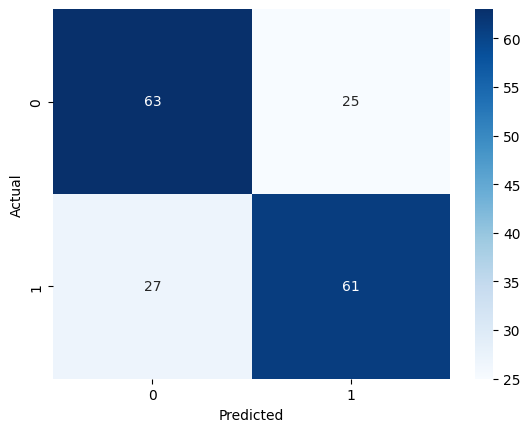

              precision    recall  f1-score   support

           0       0.70      0.72      0.71        88
           1       0.71      0.69      0.70        88

    accuracy                           0.70       176
   macro avg       0.70      0.70      0.70       176
weighted avg       0.70      0.70      0.70       176



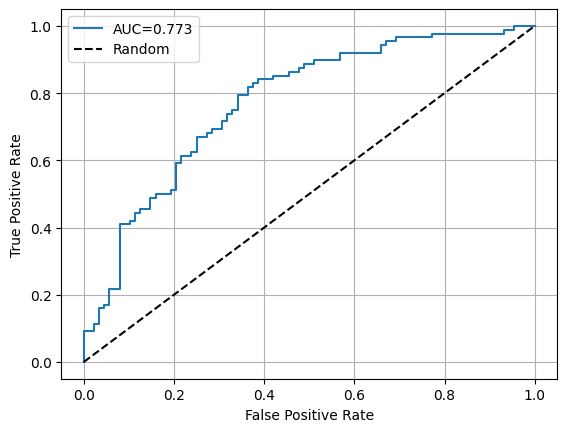

In [33]:
print("GBM")
new_evaluate(gbm, val_df[predictor_list].values, val_df['Status'].values.astype(int))

## SHAP
SHAP (SHapley Additive exPlanations) values are a method to explain the output of machine learning models. SHAP values quantify the contribution of each feature to the final prediction made by the model. They tell us how much a given feature has pushed the prediction away from the average prediction.

#### How SHAP Values are Calculated

**Model Prediction**: Consider the prediction \( f(x) \) for a particular instance \( x \).

**Baseline Prediction**: This is the average prediction across all instances in the dataset, often denoted as \( f_0 \).

**Contribution**: The SHAP value for a feature \( i \), denoted as \( \phi_i \), represents the contribution of feature \( i \) to the difference between the model’s prediction for instance \( x \) and the baseline prediction.

**Summation**: The prediction can be expressed as:

$$
f(x) = f_0 + \sum_{i=1}^{n} \phi_i
$$

In [34]:
# Create an explainer object that can compute SHAP values for the CatBoost model

explainer = shap.TreeExplainer(gbm)
shap_values = explainer(val_df[predictor_list])

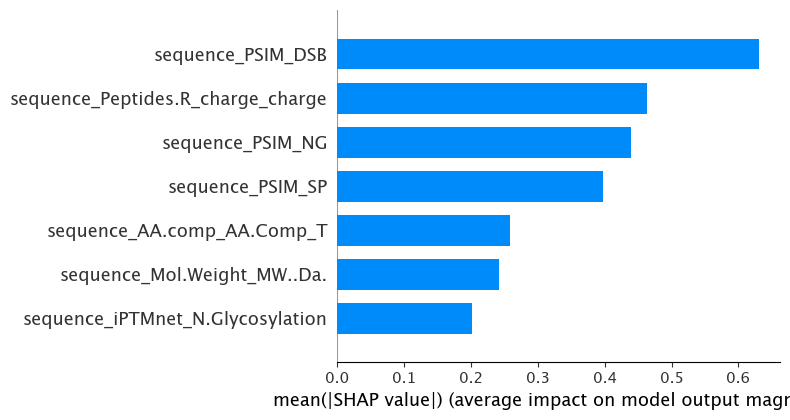

In [35]:
# Summary plot

res = shap.summary_plot(shap_values, train_df[predictor_list], feature_names=predictor_list, plot_type='bar', max_display=7)#len(predictor_list))

Each point represents a SHAP value for a single prediction in the dataset.
- Typically, the color represents the feature value (e.g., red for high values and blue for low values). This helps understand how the feature's value affects its contribution.
- The horizontal spread of points shows the range of SHAP values for that feature, indicating how much the feature's impact varies across different predictions.
- Positive SHAP Values: Indicate that the feature value increases the prediction.
- Negative SHAP Values: Indicate that the feature value decreases the prediction.

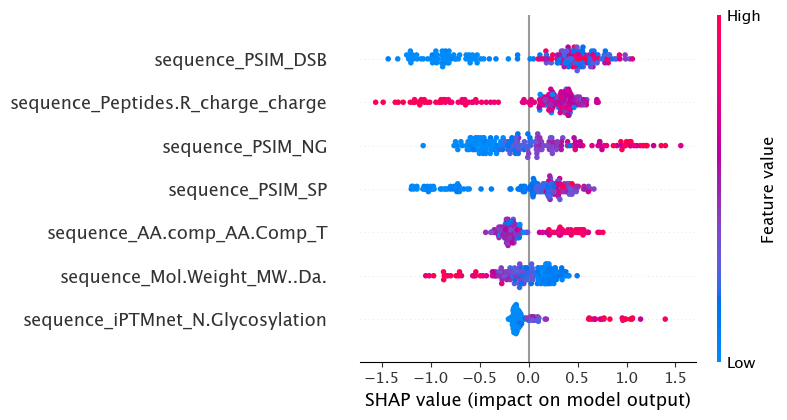

In [36]:
# make a swarm plot
res = shap.summary_plot(shap_values, feature_names=predictor_list, max_display=7)

In [37]:
explainer.expected_value

0.0034371307

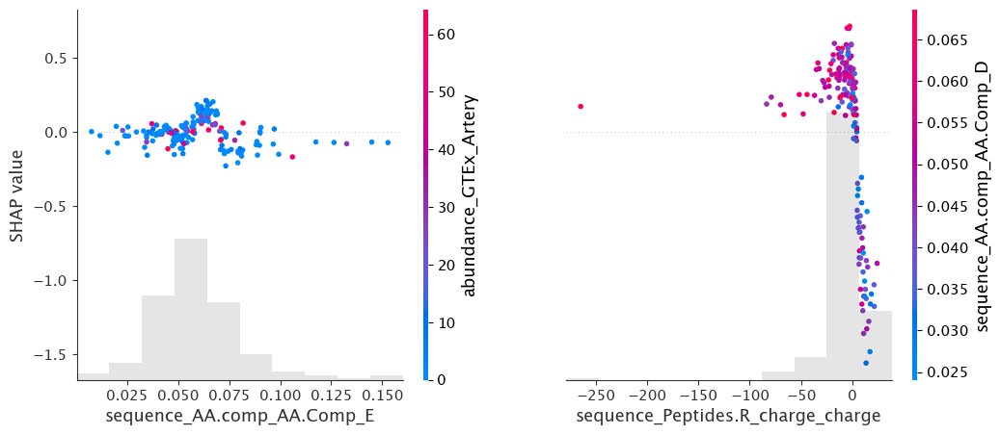

In [38]:
shap.plots.scatter(shap_values[:,['sequence_AA.comp_AA.Comp_E', 'sequence_Peptides.R_charge_charge']], color=shap_values)

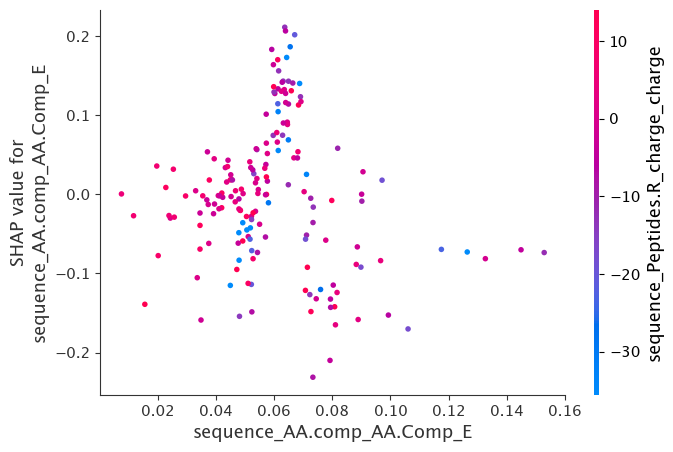

In [39]:
shap.dependence_plot(
    'sequence_AA.comp_AA.Comp_E',
    shap_values.values,
    val_df[predictor_list],
    interaction_index='sequence_Peptides.R_charge_charge'
) 


**Decision plot:** visualization that shows how each feature contributes to the model's prediction for individual instances. It helps in understanding the decision-making process of the model.

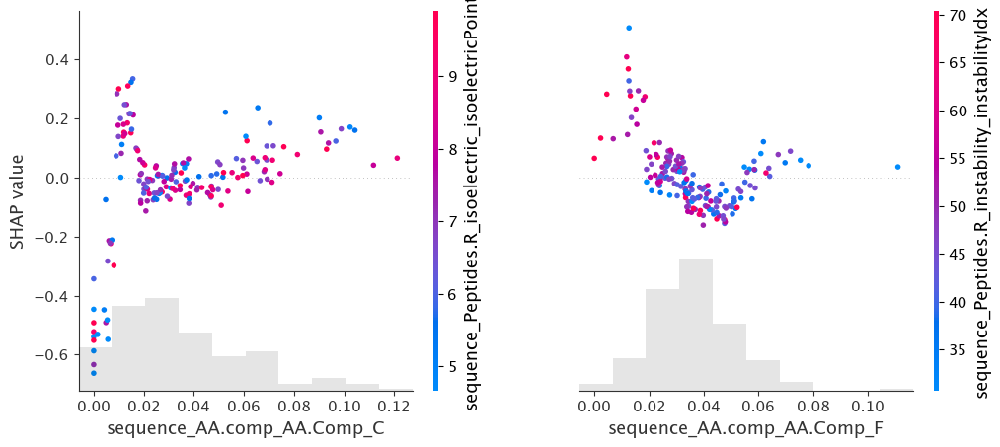

In [40]:
shap.plots.scatter(shap_values[:,['sequence_AA.comp_AA.Comp_C','sequence_AA.comp_AA.Comp_F']], color=shap_values)

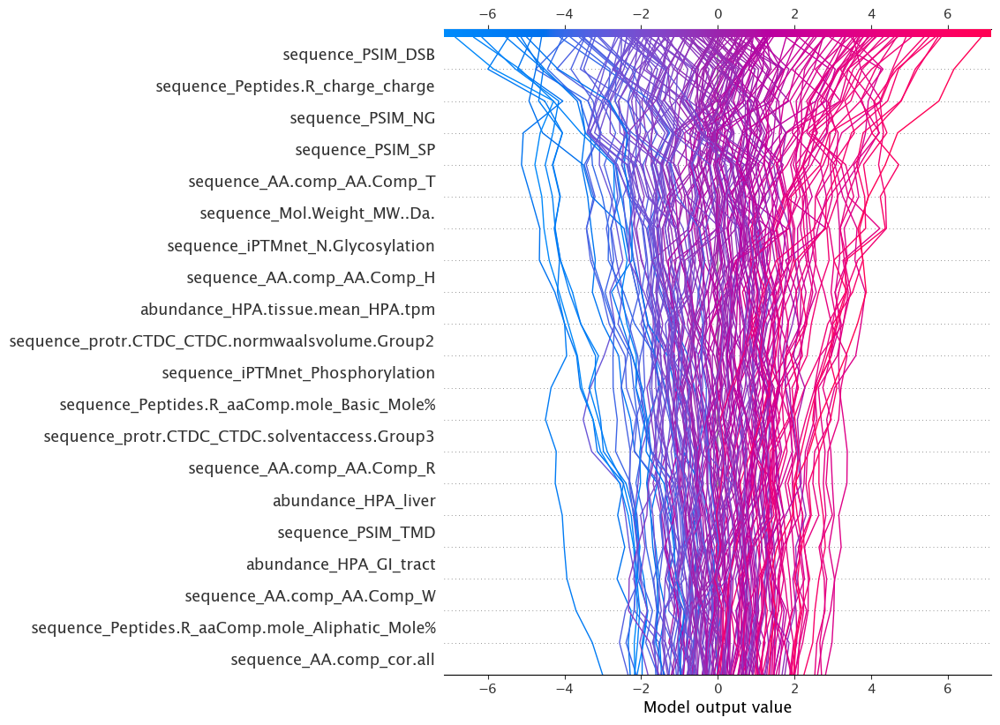

In [41]:
shap.decision_plot(explainer.expected_value, explainer.shap_values(val_df[predictor_list].values), val_df[predictor_list], feature_names=predictor_list)

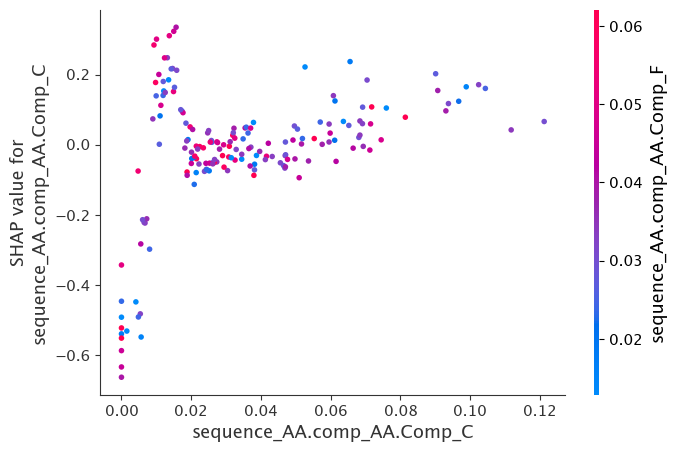

In [42]:
shap.dependence_plot(
    'sequence_AA.comp_AA.Comp_C',
    shap_values.values,
    val_df[predictor_list],
    interaction_index='sequence_AA.comp_AA.Comp_F'
) 


In [48]:
#shap.initjs()
shap.plots.force(shap_values)

# Train EBM

In [54]:
from interpret.glassbox import ExplainableBoostingClassifier

ebm = ExplainableBoostingClassifier()
ebm.fit(train_df[predictor_list], train_df['Status'])

ModuleNotFoundError: No module named 'interpret'

In [52]:
from interpret import show
from interpret.provider import InlineProvider
from interpret import set_visualize_provider

set_visualize_provider(InlineProvider())

ModuleNotFoundError: No module named 'interpret'

In [ ]:
# create ebm_global with the top 40 features
ebm_global = ebm.explain_global(  )#name='EBM')
show(ebm_global)

In [ ]:
from interpret.perf import ROC
ebm_perf = ROC(ebm).explain_perf(val_df[predictor_list], val_df['Status'], name='EBM')
show(ebm_perf)

In [ ]:
print("EBM")
new_evaluate(ebm, val_df[predictor_list].values, val_df['Status'].values)

# Explain

In [ ]:
# compatibility problems with the interpretML wrapper around sklearn, so just use sklearn directly (below)

# from interpret.glassbox import ClassificationTree

# tree = ClassificationTree()
# tree.fit(train_df[predictor_list],train_df['Status'])
# tree_perf = ROC(tree).explain_perf(train_df[predictor_list], train_df['Status'], name='Tree')
# show(tree_perf)

# tree_global = tree.explain_global(name='Tree')
# tree_local = tree.explain_local(train_df[predictor_list], train_df['Status'])
# # make text smaller on the plot

# show([tree_global, tree_local])

In [ ]:
import sklearn

sktree = sklearn.tree.DecisionTreeClassifier(criterion="entropy", max_depth=3, random_state=42)
sktree = sktree.fit(train_df[predictor_list], train_df['Status'])
y_pred = sktree.predict(test_df[predictor_list])

import matplotlib.pyplot as plt

plt.figure(figsize=(40, 10))  # Adjust the figure size as needed
sklearn.tree.plot_tree(sktree, filled=True, 
                       class_names=['Fail','Pass'], 
                       feature_names = predictor_list,
                       proportion=True, rounded=True, fontsize=18)

# Model Accuracy, how often is the classifier correct?
print(f"Decision Tree Accuracy:{sklearn.metrics.accuracy_score(test_df['Status'], y_pred):0.3f}")

plt.savefig('./data/decision_tree_plot.png', bbox_inches='tight')  # Save as PNG file
plt.savefig('./data/decision_tree_plot.pdf', bbox_inches='tight')  # Save as PDF file

plt.show()

In [ ]:
new_evaluate(sktree, val_df[predictor_list], val_df['Status'].values)

In [ ]:
# Save the study
optuna.study.write(study, storage='sqlite:///optimization_study.db')